# TCdata360 Data Census Analysis

In [1]:
import pandas as pd
import numpy as np
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import folium

import datetime
import re
import io

from scipy import stats
import statsmodels.api as sm
import scipy.cluster.hierarchy as hac
import plotly.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

%matplotlib inline

C:\Users\mrpso\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


## Set color palette

In [2]:
sns.set_style("whitegrid")
sns.set(font_scale=2)

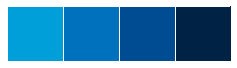

In [3]:
wbg_seq_pal = ["#009fda", '#0071bc', '#004c92', '#002245']
sns.palplot(sns.color_palette(wbg_seq_pal))

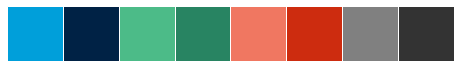

In [4]:
wbg_cat_pal = ["#009fda", '#002245', '#4cbb88', '#288462', '#f07761', '#cd2c0f', '#808080', '#333333']
sns.palplot(sns.color_palette(wbg_cat_pal))
sns.set_palette(wbg_cat_pal)

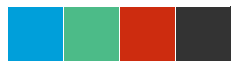

In [5]:
wbg_cat_pal2 = ["#009fda", '#4cbb88', '#cd2c0f', '#333333']
sns.palplot(sns.color_palette(wbg_cat_pal2))
sns.set_palette(wbg_cat_pal2)

# Data Preprocessing
## Loading Metadata

In [2]:
tc_datasets = 'http://tcdata360-backend.worldbank.org/api/v1/datasets'
df_tc_datasets = pd.read_json(requests.get(tc_datasets).text)

In [3]:
df_tc_datasets.head()

,description,id,legal,link,slug,source,title
0,NaN,913,"For use guidelines, please consult AfroBaromet...",http://www.afrobarometer.org/data/merged-data,AFRO,AfroBarometer,AfroBarometer
1,NaN,147,"For use guidelines, please consult Govdata360 ...",https://govdata360.worldbank.org/,PIM,Govdata360 - Public Investment Management,Public Investment Management
2,NaN,483,"For use guidelines, please consult Govdata360 ...",https://govdata360.worldbank.org/,HRM,Govdata360 - Human Resource Management,Human Resource Management
3,NaN,747,"For use guidelines, please consult World Bank ...",https://data.worldbank.org/data-catalog/ed-stats,WBG-genderstats,WBG - Gender Statistics,Gender Statistics
4,NaN,53,"For use guidelines, please consult World Econo...",http://reports.weforum.org/global-competitiven...,global_competitiveness_index,World Economic Forum Global Competitiveness Index,World Economic Forum Global Competitiveness Index


In [8]:
df_tc_countries = pd.read_json(requests.get('http://tcdata360-backend.worldbank.org/api/v1/countries').text)

In [9]:
# fixing Argentina (incomeLevel should be UMC)
df_tc_countries.loc[df_tc_countries['iso3'] == 'ARG','incomeLevel']='UMC'

In [10]:
df_tc_countries[df_tc_countries['iso3'] == 'ARG']

,adminRegion,aggregate,capitalCity,geo,id,incomeLevel,iso2,iso3,lendingType,name,region
7,None,False,Buenos Aires,"{'lat': -34.6118, 'lng': -58.4173}",ARG,UMC,AR,ARG,IBD,Argentina,LCN


## Normalizing Time data
For efficiency, we choose to normalize the data per dataset (instead of per country) since intra-dataset time periods are usually consistent.

### Defining Functions

In [78]:
# def normalize_dates(list_dates):
#     normed_dates = []
#     for x in list_dates:
#         cleaned_date = x
#         # for period dates, we get the earlier date (e.g., 2008-2009 -- we use 2008)
#         m = re.match('(\d{4})-(\d{4})', str(x))
#         if m:
#             cleaned_date = m.groups()[-1]
#         else: #for simplicity, we remap monthly/quarterly dates
#             n = re.match('(\d{4})Q\d{1}', str(x))
#             if n:
#                 cleaned_date = n.groups()[-1]
#             else:
#                 o = re.match('(\d{4})M\d{2}', str(x))
#                 if o:
#                     cleaned_date = o.groups()[-1]
#         normed_dates.append(cleaned_date)
#     return normed_dates

In [131]:
def normalize_dates(list_dates):
    normed_dates = []
    not_normed_list = []
    not_normed = False
    
    for x in list_dates:
        cleaned_date = x
        
        # for period dates, we get the earlier date (e.g., 2008-2009 -- we use 2008)
        m = re.match('(\d{4})-(\d{4})', str(x))
        m2 = re.match('(\d{4})-(\d{2})', str(x))
        if m:
            cleaned_date = m.groups()[0]
            not_normed = False
            
        elif m2:
            cleaned_date = m2.groups()[0]
            not_normed = False
                
        else: #for simplicity, we remap monthly/quarterly dates
            n = re.match('(\d{4})Q\d{1}', str(x))
            if n:
                cleaned_date = n.groups()[-1]
                not_normed = True
            else:
                o = re.match('(\d{4})M\d{2}', str(x))
                if o:
                    cleaned_date = o.groups()[-1]
                    not_normed = True
                    
        normed_dates.append(cleaned_date)
        not_normed_list.append(not_normed)
    return normed_dates, not_normed_list, sum(not_normed_list)

In [132]:
normalize_dates(['2011Q1', '2011-2012', '2013-14'])

(['2011', '2011', '2013'], [True, False, False], 1)

### Preprocess dataset (normalized time periods)
Assumptions for data preprocessing:
- for period dates, we get the earlier date (e.g., 2008-2009 -- we use 2008)
- for simplicity, we get the mean presence of monthly/quarterly dates (e.g., if only 1 of 4 quarterly data is available for that year, that year has the value 0.25)
- we also keep indicator-levels data only. Subindicators are removed from analysis since this might bloat counts for datasets with a lot of subindicators -- for instance, Doing Business data has DTF/Rank subindicator data for each indicator.

In [133]:
df_compiled = pd.DataFrame()
success_counter = 0
error_counter = 0
error_list = []
total_count = len(df_tc_datasets.index)

for row in df_tc_datasets.index:
# row = df_tc_datasets.index[0]
    id_dataset = df_tc_datasets['id'].iloc[row]
    title_dataset = df_tc_datasets['title'].loc[row]

    try:
        dat_url = "http://tcdata360-backend.worldbank.org/api/v1/datasets/" + str(id_dataset) + "/dump.csv"
        dat = requests.get(dat_url)
        df_dat = pd.read_csv(io.StringIO(dat.text))
        df_dat.drop(['Country Name', 'Subindicator Type'], axis=1, inplace=True)

        # Group columns by type: date, and non-date
        nondate_cols = ['Country ISO3', 'Country Name', 'Indicator', 'Subindicator Type', 'Partner', 'MRV', 'Product']
        list_nondate = [col for col in df_dat.columns if col in nondate_cols]
        list_timeframe = [col for col in df_dat.columns if col not in nondate_cols]

        #Convert date columns to boolean
        df_dat[list_timeframe] = df_dat[list_timeframe].notnull().replace({True:1.0, False:0.0})

        normed_dates, not_normed_list, not_normed = normalize_dates(list_timeframe)

        if not_normed > 0:
            df_temp = df_dat[list_nondate]

            # collate all possible dates
            pat = '(\d{4})Q\d{1}'
            df_grouped = df_dat.groupby(df_dat.columns.str.extract(pat, expand=False), axis=1)
            if bool(df_grouped.groups):
                for group in df_grouped.groups.keys():
                    df_temp[group] = df_grouped.get_group(group).mean(axis=1)
            else:
                pat = '(\d{4})M\d{2}'
                df_grouped = df_dat.groupby(df_dat.columns.str.extract(pat, expand=False), axis=1)
                if bool(df_grouped.groups):
                    for group in df_grouped.groups.keys():
                        df_temp[group] = df_grouped.get_group(group).mean(axis=1)
        else:
            df_temp = df_dat
            new_cols = list_nondate + list_timeframe
            df_temp = df_temp[new_cols]
            df_temp.columns = list_nondate + normed_dates

        df_temp['dataset_id'] = id_dataset
        df_compiled = df_compiled.append(df_temp)
    
        success_counter += 1
        print("Done checking %d out of %d datasets." % (success_counter + error_counter, total_count))

    except:
        error_counter += 1
        error_list.append([title_dataset, id_dataset])
        continue

print("Done with all %d datasets with %d successes and %d failures." % (total_count, success_counter, error_counter))
print("Failed datasets include %s" % str(error_list))

Done checking 1 out of 76 datasets.
Done checking 2 out of 76 datasets.
Done checking 3 out of 76 datasets.
Done checking 4 out of 76 datasets.
Done checking 5 out of 76 datasets.
Done checking 6 out of 76 datasets.
Done checking 7 out of 76 datasets.
Done checking 8 out of 76 datasets.
Done checking 9 out of 76 datasets.
Done checking 10 out of 76 datasets.
Done checking 11 out of 76 datasets.


C:\Users\mrpso\Anaconda3\lib\site-packages\ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\mrpso\Anaconda3\lib\site-packages\ipykernel_launcher.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Done checking 12 out of 76 datasets.
Done checking 13 out of 76 datasets.
Done checking 14 out of 76 datasets.
Done checking 15 out of 76 datasets.
Done checking 16 out of 76 datasets.
Done checking 17 out of 76 datasets.


C:\Users\mrpso\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2717: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Done checking 18 out of 76 datasets.
Done checking 19 out of 76 datasets.
Done checking 20 out of 76 datasets.
Done checking 21 out of 76 datasets.
Done checking 22 out of 76 datasets.
Done checking 23 out of 76 datasets.
Done checking 24 out of 76 datasets.
Done checking 25 out of 76 datasets.
Done checking 26 out of 76 datasets.
Done checking 27 out of 76 datasets.
Done checking 28 out of 76 datasets.
Done checking 29 out of 76 datasets.
Done checking 30 out of 76 datasets.
Done checking 31 out of 76 datasets.
Done checking 32 out of 76 datasets.
Done checking 33 out of 76 datasets.
Done checking 34 out of 76 datasets.
Done checking 35 out of 76 datasets.
Done checking 36 out of 76 datasets.
Done checking 37 out of 76 datasets.
Done checking 38 out of 76 datasets.
Done checking 39 out of 76 datasets.
Done checking 41 out of 76 datasets.
Done checking 42 out of 76 datasets.
Done checking 44 out of 76 datasets.
Done checking 45 out of 76 datasets.
Done checking 46 out of 76 datasets.
D

In [134]:
df_compiled.shape

(1204953, 115)

In [135]:
df_compiled.head()

,1919,1920,1921,1922,1923,1924,1925,1926,1927,1928,...,2024,2025,2026,2027,Country ISO3,Indicator,MRV,Partner,Product,dataset_id
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,ABW,i Annual deviation of actual total HLG transfe...,NaN,NaN,NaN,590
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,ABW,ii Annual variance between actual and estimate...,NaN,NaN,NaN,590
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,ABW,iii Inyear timeliness of transfers from HLG co...,NaN,NaN,NaN,590
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,ABW,Predictability of Transfers from Higher Level ...,NaN,NaN,NaN,590
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,AFG,Aggregate expenditure outturn compared to orig...,NaN,NaN,NaN,590


In [136]:
df_compiled.columns

Index(['1919', '1920', '1921', '1922', '1923', '1924', '1925', '1926', '1927',
       '1928',
       ...
       '2024', '2025', '2026', '2027', 'Country ISO3', 'Indicator', 'MRV',
       'Partner', 'Product', 'dataset_id'],
      dtype='object', length=115)

In [5]:
nondate_cols = ['Country ISO3', 'Country Name', 'Indicator', 'Subindicator Type', 'Partner', 'MRV', 'Product']
nondate_cols_all = nondate_cols + ['dataset_id']
list_nondate_all = [col for col in df_compiled.columns if col in nondate_cols_all]
list_timeframe_all = [col for col in df_compiled.columns if col not in nondate_cols_all]

In [6]:
list_timeframe_all

['1919',
 '1920',
 '1921',
 '1922',
 '1923',
 '1924',
 '1925',
 '1926',
 '1927',
 '1928',
 '1929',
 '1930',
 '1931',
 '1932',
 '1933',
 '1934',
 '1935',
 '1936',
 '1937',
 '1938',
 '1939',
 '1940',
 '1941',
 '1942',
 '1943',
 '1944',
 '1945',
 '1946',
 '1947',
 '1948',
 '1949',
 '1950',
 '1951',
 '1952',
 '1953',
 '1954',
 '1955',
 '1956',
 '1957',
 '1958',
 '1959',
 '1960',
 '1961',
 '1962',
 '1963',
 '1964',
 '1965',
 '1966',
 '1967',
 '1968',
 '1969',
 '1970',
 '1971',
 '1972',
 '1973',
 '1974',
 '1975',
 '1976',
 '1977',
 '1978',
 '1979',
 '1980',
 '1981',
 '1982',
 '1983',
 '1984',
 '1985',
 '1986',
 '1987',
 '1988',
 '1989',
 '1990',
 '1991',
 '1992',
 '1993',
 '1994',
 '1995',
 '1996',
 '1997',
 '1998',
 '1999',
 '2000',
 '2001',
 '2002',
 '2003',
 '2004',
 '2005',
 '2006',
 '2007',
 '2008',
 '2009',
 '2010',
 '2011',
 '2012',
 '2013',
 '2014',
 '2015',
 '2016',
 '2017',
 '2018',
 '2019',
 '2020',
 '2021',
 '2022',
 '2023',
 '2024',
 '2025',
 '2026',
 '2027']

In [149]:
df_compiled.reset_index(drop=True, inplace=True)

In [ ]:
df_compiled.to_csv("2017-08-05-TCdataset-complete.csv", index=False)

### Post-compilation Processing
- fill NA with 0
- drop duplicates (keep indicator-level data only)
- map indicators to Indicator ID
- map indicators to topics (we keep first hierarchy only)

In [7]:
df_compiled = pd.read_csv("2017-08-05-TCdataset-complete.csv")

C:\Users\mrpso\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2717: DtypeWarning: Columns (112,113) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [8]:
df_compiled[list_timeframe_all] = df_compiled[list_timeframe_all].replace({np.nan: 0.0})

In [9]:
df_compiled.head()

,1919,1920,1921,1922,1923,1924,1925,1926,1927,1928,...,2024,2025,2026,2027,Country ISO3,Indicator,MRV,Partner,Product,dataset_id
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,ABW,i Annual deviation of actual total HLG transfe...,NaN,NaN,NaN,590
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,ABW,ii Annual variance between actual and estimate...,NaN,NaN,NaN,590
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,ABW,iii Inyear timeliness of transfers from HLG co...,NaN,NaN,NaN,590
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,ABW,Predictability of Transfers from Higher Level ...,NaN,NaN,NaN,590
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,AFG,Aggregate expenditure outturn compared to orig...,NaN,NaN,NaN,590


In [10]:
df_compiled.drop_duplicates(inplace=True)

#### Merging Indicator and Nav lists for TC

In [11]:
df_tc_indicators = pd.read_json(requests.get('http://tcdata360-backend.worldbank.org/api/v1/indicators').text)
df_tc_indicators = df_tc_indicators[['datasetId', 'name', 'id']]
df_tc_indicators.drop_duplicates(subset=['datasetId', 'name'], inplace=True)

In [14]:
df_tc_nav = pd.read_csv("2017-08-07-TC-hierarchy.csv")
df_tc_nav = df_tc_nav.drop_duplicates(subset=['indicator.name'])[['indicator.name', 'level0.name','level1.name']]

In [47]:
df_tc_nav['name-lookup'] = df_tc_nav['indicator.name'].apply(lambda x: x.lower().strip())
df_tc_indicators['name-lookup'] = df_tc_indicators['name'].apply(lambda x: x.lower().strip())

In [48]:
df_tc_ind_nav = df_tc_indicators.merge(df_tc_nav, how='left', on='name-lookup')

#### Merging Indicator and Nav lists for Gov

In [40]:
df_gv_indicators = pd.read_json(requests.get('http://govdata360-backend.worldbank.org/api/v1/indicators').text)
df_gv_indicators = df_gv_indicators[['datasetId', 'name', 'id']]
df_gv_indicators.drop_duplicates(subset=['datasetId', 'name'], inplace=True)

In [41]:
df_gv_nav = pd.read_csv("2017-08-07-Gov-hierarchy.csv")
df_gv_nav = df_gv_nav.drop_duplicates(subset=['indicator.name'])[['indicator.name', 'level0.name','level1.name']]

In [49]:
df_gv_nav['name-lookup'] = df_gv_nav['indicator.name'].apply(lambda x: x.lower().strip())
df_gv_indicators['name-lookup'] = df_gv_indicators['name'].apply(lambda x: x.lower().strip())

In [51]:
df_gv_ind_nav = df_gv_indicators.merge(df_gv_nav, how='left', on='name-lookup')

In [52]:
df_ind_nav = pd.concat([df_tc_ind_nav, df_gv_ind_nav], axis=0).reset_index(drop=True)

In [53]:
df_ind_nav.to_csv("2017-08-07-TCGov-ind-hierarchy-merged.csv", index=False)

Import manually cleaned merged hierarchy-indicator list for TC and Gov

In [54]:
df_ind_nav = pd.read_csv("2017-08-07-TCGov-ind-hierarchy-merged-complete.csv")

In [60]:
df_ind_nav.columns = ['datasetId', 'name', 'indicatorId', 'name-lookup', 'indicator.name','topiclvl1', 'topiclvl2']

In [61]:
df_merged = df_compiled.merge(df_ind_nav, how='left', left_on=['dataset_id', 'Indicator'], right_on=['datasetId', 'name'])

In [68]:
df_merged = df_merged[df_merged['name'].notnull()]

In [70]:
df_merged[df_merged['indicator.name'].isnull()]

,1919,1920,1921,1922,1923,1924,1925,1926,1927,1928,...,Partner,Product,dataset_id,datasetId,name,indicatorId,name-lookup,indicator.name,topiclvl1,topiclvl2


#### Removing product- and partner-level indicators

In [213]:
df_merged.shape

(989910, 117)

In [215]:
df_merged.drop_duplicates(subset=['dataset_id', 'indicatorId', 'Country ISO3']).shape

(461127, 117)

In [216]:
df_merged2 = df_merged.drop_duplicates(subset=['dataset_id', 'indicatorId', 'Country ISO3'])

In [221]:
df_merged2.groupby('Country ISO3')['dataset_id'].value_counts().unstack(level=-1)

dataset_id,44,45,46,47,48,49,50,51,52,53,...,495,505,508,509,511,512,513,514,589,590
Country ISO3,,,,,,,,,,,,,,,,,,,,,
ABW,NaN,3.0,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0
AFG,2.0,3.0,NaN,22.0,112.0,121.0,7.0,6.0,65.0,NaN,...,2.0,51.0,2.0,2.0,NaN,3.0,1.0,NaN,NaN,106.0
AGO,NaN,3.0,NaN,22.0,116.0,120.0,7.0,6.0,64.0,120.0,...,1.0,51.0,2.0,2.0,NaN,3.0,1.0,NaN,12.0,NaN
ALB,4.0,3.0,NaN,23.0,112.0,121.0,7.0,6.0,65.0,120.0,...,1.0,52.0,2.0,2.0,2.0,4.0,1.0,1.0,NaN,106.0
AND,NaN,3.0,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,...,1.0,NaN,2.0,NaN,NaN,4.0,NaN,NaN,NaN,NaN
ARE,4.0,3.0,NaN,NaN,118.0,NaN,7.0,6.0,65.0,119.0,...,1.0,51.0,2.0,2.0,2.0,4.0,1.0,1.0,NaN,NaN
ARG,10.0,3.0,4.0,23.0,117.0,119.0,7.0,6.0,65.0,120.0,...,2.0,52.0,2.0,2.0,2.0,4.0,1.0,1.0,NaN,NaN
ARM,6.0,3.0,NaN,23.0,119.0,121.0,7.0,6.0,65.0,120.0,...,1.0,52.0,2.0,2.0,2.0,4.0,1.0,1.0,NaN,106.0
ASM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [222]:
df_merged2.drop(['Partner', 'Product'], axis=1, inplace=True)

C:\Users\mrpso\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [224]:
df_merged2.reset_index(drop=True, inplace=True)

### Export as CSV, HDF5 files

In [71]:
df_merged.to_csv("2017-08-05-TCdataset-deduped-mapped-verbose.csv", index=False)

In [72]:
df_merged.head()

,1919,1920,1921,1922,1923,1924,1925,1926,1927,1928,...,Partner,Product,dataset_id,datasetId,name,indicatorId,name-lookup,indicator.name,topiclvl1,topiclvl2
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,590,590.0,i Annual deviation of actual total HLG transfe...,27373.0,i annual deviation of actual total hlg transfe...,i Annual deviation of actual total HLG transfe...,Public Sector Management,Public Expenditure Management
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,590,590.0,ii Annual variance between actual and estimate...,27406.0,ii annual variance between actual and estimate...,ii Annual variance between actual and estimate...,Public Sector Management,Public Expenditure Management
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,590,590.0,iii Inyear timeliness of transfers from HLG co...,27336.0,iii inyear timeliness of transfers from hlg co...,iii Inyear timeliness of transfers from HLG co...,Public Sector Management,Public Expenditure Management
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,590,590.0,Predictability of Transfers from Higher Level ...,27358.0,predictability of transfers from higher level ...,Predictability of Transfers from Higher Level ...,Public Sector Management,Public Expenditure Management
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,590,590.0,Aggregate expenditure outturn compared to orig...,27333.0,aggregate expenditure outturn compared to orig...,Aggregate expenditure outturn compared to orig...,Public Sector Management,Public Expenditure Management


In [74]:
df_merged.drop(['name-lookup','indicator.name', 'name','datasetId', 'Indicator'], axis=1,inplace=True)

In [85]:
df_merged.head()

,1919,1920,1921,1922,1923,1924,1925,1926,1927,1928,...,2026,2027,Country ISO3,MRV,Partner,Product,dataset_id,indicatorId,topiclvl1,topiclvl2
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,ABW,NaN,NaN,NaN,590,27373.0,Public Sector Management,Public Expenditure Management
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,ABW,NaN,NaN,NaN,590,27406.0,Public Sector Management,Public Expenditure Management
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,ABW,NaN,NaN,NaN,590,27336.0,Public Sector Management,Public Expenditure Management
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,ABW,NaN,NaN,NaN,590,27358.0,Public Sector Management,Public Expenditure Management
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,AFG,NaN,NaN,NaN,590,27333.0,Public Sector Management,Public Expenditure Management


In [86]:
df_merged.to_csv("2017-08-05-TCdataset-deduped-mapped.csv", index=False)

In [225]:
df_merged2.to_csv("2017-08-05-TCdataset-deduped-mapped-final.csv", index=False)

In [237]:
store = pd.HDFStore('TCdatacensusdata.h5')

In [238]:
store

<class 'pandas.io.pytables.HDFStore'>
File path: TCdatacensusdata.h5
/df_tcdata                          frame_table  (typ->appendable,nrows->1204953,ncols->115,indexers->[index])
/df_tcdata_cleaned                  frame_table  (typ->appendable,nrows->989910,ncols->117,indexers->[index]) 
/df_tcdata_cleaned_final            frame_table  (typ->appendable,nrows->461127,ncols->115,indexers->[index]) 

In [239]:
store.is_open

True

In [231]:
df_merged2.to_hdf('TCdatacensusdata.h5', 'df_tcdata_cleaned_final', format = 'table')

In [240]:
store.close()

# More Processing: Filtering Timeframes and Topics

In [6]:
df_merged2 = pd.read_csv("2017-08-05-TCdataset-deduped-mapped-final.csv")

## Keep only T&C Topics: Trade, Innovation, Sectors, Investment

In [7]:
df_merged2 = df_merged2[df_merged2['topiclvl1'].isin(['Trade', 'Innovation', 'Sectors','Investment'])]

In [8]:
df_merged2['topiclvl1'].value_counts()

Investment    75368
Trade         72332
Innovation    20650
Sectors       13664
Name: topiclvl1, dtype: int64

In [9]:
df_merged2.columns

Index(['1919', '1920', '1921', '1922', '1923', '1924', '1925', '1926', '1927',
       '1928',
       ...
       '2024', '2025', '2026', '2027', 'Country ISO3', 'MRV', 'dataset_id',
       'indicatorId', 'topiclvl1', 'topiclvl2'],
      dtype='object', length=115)

## Drop irrelevant timeframes
- NULL timeframes: 1919-1954
- Incomplete/projected timeframes: 2017-2027

In [10]:
df_merged2.shape

(182014, 115)

In [11]:
check_sums = df_merged2.describe().T

In [17]:
check_sums[(check_sums['mean'] == 0) & (check_sums['max'] == 0)]

,count,mean,std,min,25%,50%,75%,max
1919,182014.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1920,182014.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1921,182014.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1922,182014.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1923,182014.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1924,182014.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1925,182014.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1926,182014.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1927,182014.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1928,182014.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [26]:
check_sums.loc['2017':'MRV']

,count,mean,std,min,25%,50%,75%,max
2017,182014.0,0.040997,0.198283,0.0,0.000000,0.000000,0.000000,1.0000
2018,182014.0,0.013510,0.115445,0.0,0.000000,0.000000,0.000000,1.0000
2019,182014.0,0.013510,0.115445,0.0,0.000000,0.000000,0.000000,1.0000
2020,182014.0,0.013510,0.115445,0.0,0.000000,0.000000,0.000000,1.0000
2021,182014.0,0.013510,0.115445,0.0,0.000000,0.000000,0.000000,1.0000
2022,182014.0,0.013510,0.115445,0.0,0.000000,0.000000,0.000000,1.0000
2023,182014.0,0.011604,0.107093,0.0,0.000000,0.000000,0.000000,1.0000
2024,182014.0,0.011604,0.107093,0.0,0.000000,0.000000,0.000000,1.0000
2025,182014.0,0.011604,0.107093,0.0,0.000000,0.000000,0.000000,1.0000
2026,182014.0,0.011604,0.107093,0.0,0.000000,0.000000,0.000000,1.0000


In [12]:
drop_timeframes = list(check_sums[(check_sums['mean'] == 0) & (check_sums['max'] == 0)].index) + list(check_sums.loc['2017':'MRV'].index)

In [13]:
df_merged2.drop(drop_timeframes, axis=1, inplace=True)

## Checks and Generate handy lists

In [15]:
df_merged2.columns

Index(['1955', '1956', '1957', '1958', '1959', '1960', '1961', '1962', '1963',
       '1964', '1965', '1966', '1967', '1968', '1969', '1970', '1971', '1972',
       '1973', '1974', '1975', '1976', '1977', '1978', '1979', '1980', '1981',
       '1982', '1983', '1984', '1985', '1986', '1987', '1988', '1989', '1990',
       '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999',
       '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008',
       '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016',
       'Country ISO3', 'dataset_id', 'indicatorId', 'topiclvl1', 'topiclvl2'],
      dtype='object')

In [16]:
df_merged2[['indicatorId', 'Country ISO3', 'dataset_id']].duplicated().sum()

0

In [17]:
df_merged2.to_csv("2017-08-31-TCdataset-narrowtopics.csv", index=False)

# Country-level Data Analysis

In [4]:
df_merged2 = pd.read_csv("2017-08-31-TCdataset-narrowtopics.csv")
nondate_cols_all = ['Country ISO3','dataset_id','indicatorId', 'topiclvl1', 'topiclvl2']
list_timeframe_all = [col for col in df_merged2.columns if col not in nondate_cols_all]

In [12]:
total_indicators = len(df_merged2['indicatorId'].unique())

In [13]:
total_indicators

1374

In [14]:
by_country = df_merged2.groupby('Country ISO3')[list_timeframe_all].sum()/total_indicators

In [15]:
by_country.head()

,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
Country ISO3,,,,,,,,,,,,,,,,,,,,,
ABW,0.0,0.0,0.0,0.0,0.0,0.000728,0.000000,0.000000,0.000000,0.000000,...,0.095342,0.093886,0.105531,0.108443,0.122271,0.110626,0.111354,0.093886,0.104440,0.010917
AFG,0.0,0.0,0.0,0.0,0.0,0.015284,0.013828,0.019651,0.019651,0.025473,...,0.109170,0.233624,0.141557,0.152111,0.146288,0.181951,0.171761,0.255459,0.144469,0.165211
AGO,0.0,0.0,0.0,0.0,0.0,0.014556,0.013100,0.020378,0.013100,0.013100,...,0.137555,0.152111,0.156477,0.388646,0.243086,0.287482,0.286754,0.417758,0.235808,0.256186
ALB,0.0,0.0,0.0,0.0,0.0,0.003639,0.002183,0.002183,0.002183,0.002183,...,0.349345,0.278748,0.283115,0.327511,0.289665,0.395197,0.435226,0.438865,0.351164,0.438137
AND,0.0,0.0,0.0,0.0,0.0,0.000728,0.000000,0.000000,0.000000,0.000000,...,0.036390,0.036390,0.036390,0.036390,0.036390,0.036390,0.034207,0.034207,0.012373,0.002911


In [16]:
df_tc_countries.set_index('id', inplace=True)

In [17]:
by_country = by_country.join(df_tc_countries[['region', 'incomeLevel', 'lendingType']], how='left')

## Timeseries Plots

In [24]:
(pd.DataFrame(by_country[list_timeframe_all].median(axis=0))*100).to_csv("data/1.1-overall-median-data-availability-pct.csv")

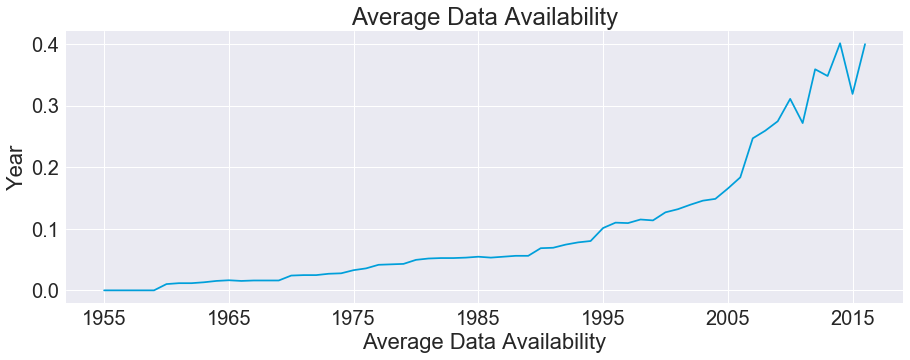

In [18]:
plt.title("Average Data Availability")
plt.ylabel("Year")
plt.xlabel("Average Data Availability")
by_country[list_timeframe_all].median(axis=0).plot(figsize=(15,5))

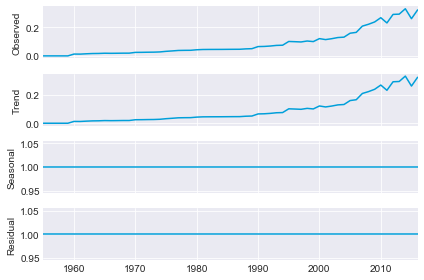

In [31]:
dat = pd.DataFrame(by_country[list_timeframe_all].mean(axis=0))
dat.index = pd.to_datetime(dat.index)
res = sm.tsa.seasonal_decompose(dat[0],model='multiplicative')
resplot = res.plot()

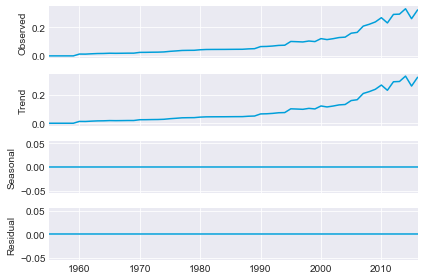

In [32]:
res = sm.tsa.seasonal_decompose(dat[0],model='additive')
resplot = res.plot()

In [28]:
by_country[list_timeframe_all].T.to_csv("data/1.2-bycountry-data-availability.csv")

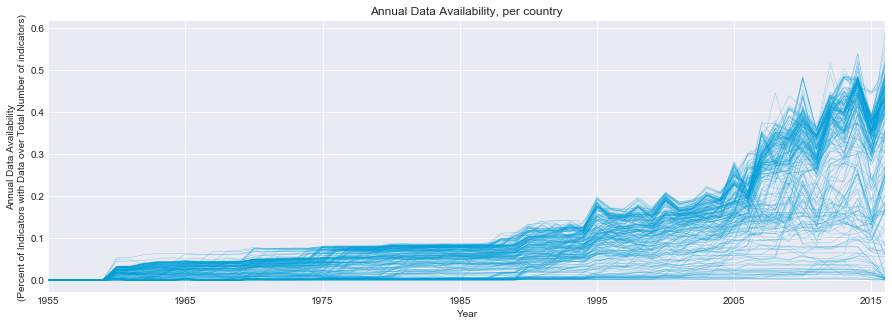

In [33]:
by_country[list_timeframe_all].T.plot(color='#009fda', lw=0.5, alpha=0.4, figsize=(15,5))
plt.title("Annual Data Availability, per country")
plt.ylabel("Annual Data Availability\n(Percent of Indicators with Data over Total Number of indicators)")
plt.xlabel("Year")
plt.legend([])

In [77]:
by_country_melt.head()

,Country ISO3,region,incomeLevel,lendingType,cluster,Period,Observation
0,ABW,LCN,HIC,LNX,1,1955,0.0
1,AFG,SAS,LIC,IDX,1,1955,0.0
2,AGO,SSF,UMC,IBD,1,1955,0.0
3,ALB,ECS,UMC,IBD,1,1955,0.0
4,AND,ECS,HIC,LNX,1,1955,0.0


### By Condition

In [78]:
def tsplot_bycond(by_country_melt, cond):
    plt.figure(figsize=(15,5))
    sns.tsplot(data=by_country_melt, time='Period', value='Observation', unit='Country ISO3', condition = cond,err_style='unit_traces', err_kws = {'alpha': 0.05})
    plt.title("Annual Data Availability, per country, per %s\n(Mean Estimator)" % (cond))
    plt.ylabel("Annual Data Availability\n(Percent of Indicators with Data over Total Number of indicators)")
    plt.xlabel("Year")
    plt.show()
    
    plt.figure(figsize=(15,5))
    sns.tsplot(data=by_country_melt, time='Period', value='Observation', unit='Country ISO3', condition = cond, err_style='ci_band', ci=[0,100], err_kws = {'alpha': 0.05})
    plt.title("Annual Data Availability, per country, per %s\n(Mean Estimator)" % (cond))
    plt.ylabel("Annual Data Availability\n(Percent of Indicators with Data over Total Number of indicators)")
    plt.xlabel("Year")
    plt.show()
    
    plt.figure(figsize=(15,5))
    sns.tsplot(data=by_country_melt, time='Period', value='Observation', unit='Country ISO3', condition = cond, err_style='ci_band', ci=[0,100], estimator=np.median, err_kws = {'alpha': 0.05})
    plt.title("Annual Data Availability, per country, per %s\n(Median estimator)" % (cond))
    plt.ylabel("Annual Data Availability\n(Percent of Indicators with Data over Total Number of indicators)")
    plt.xlabel("Year")
    plt.show()

In [ ]:
sns.set(font_scale=1.5, )

In [81]:
def tsplot_bycond_median(by_country_melt, cond):
    plt.figure(figsize=(15,5))
    sns.tsplot(data=by_country_melt, time='Period', value='Observation', unit='Country ISO3', condition = cond, err_style='ci_band', ci=[0,100], estimator=np.median, err_kws = {'alpha': 0.05})
    plt.title("Annual Data Availability, per country, per %s\n(Median estimator)" % (cond))
    plt.xlabel("Year")
    plt.show()

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



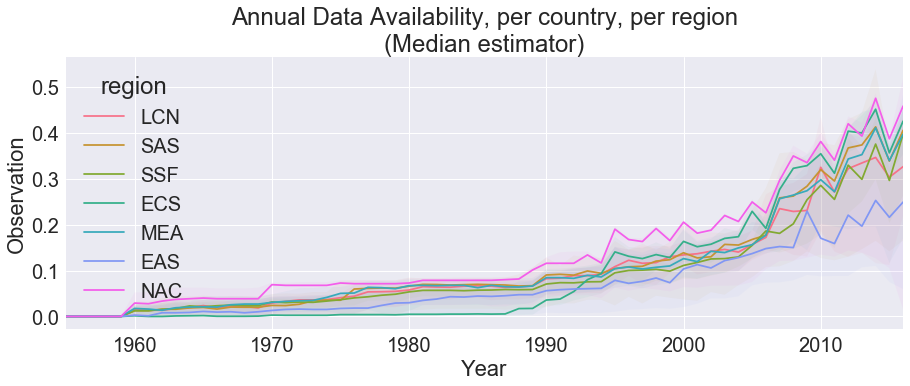

In [82]:
tsplot_bycond_median(by_country_melt, cond='region')

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



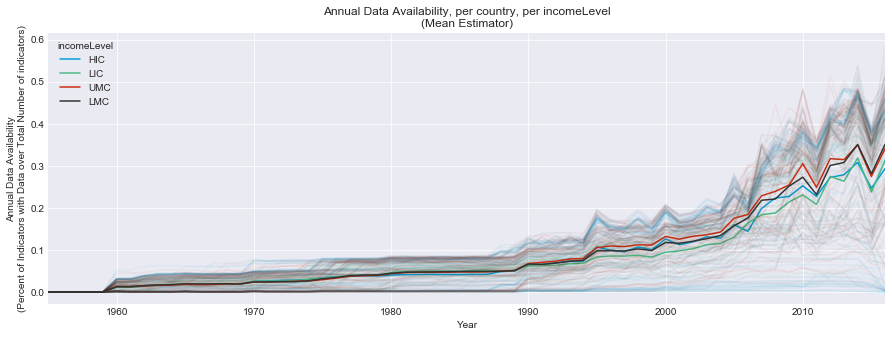

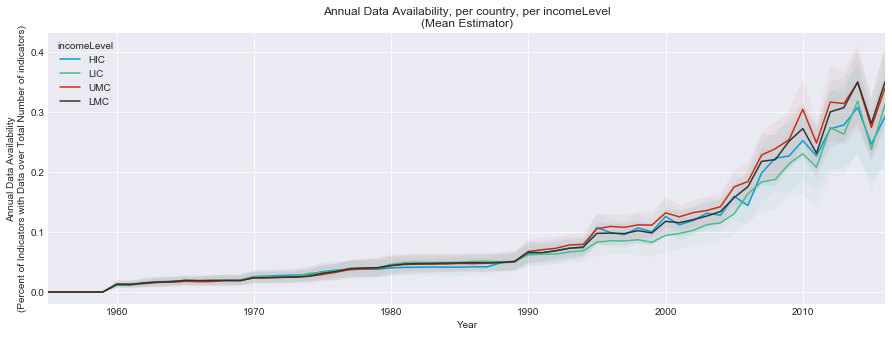

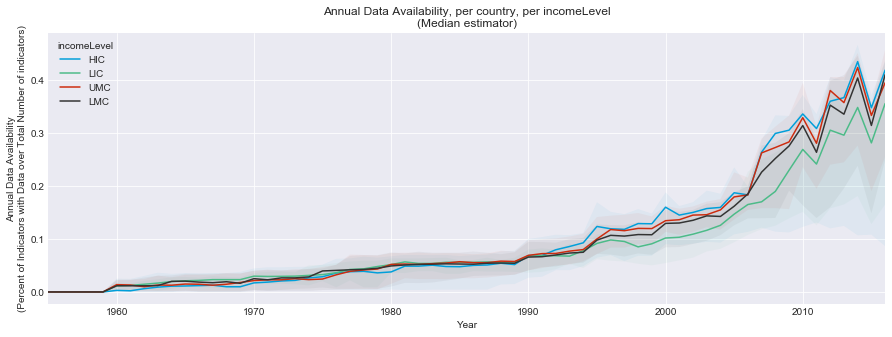

In [152]:
tsplot_bycond(by_country_melt, cond='incomeLevel')

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



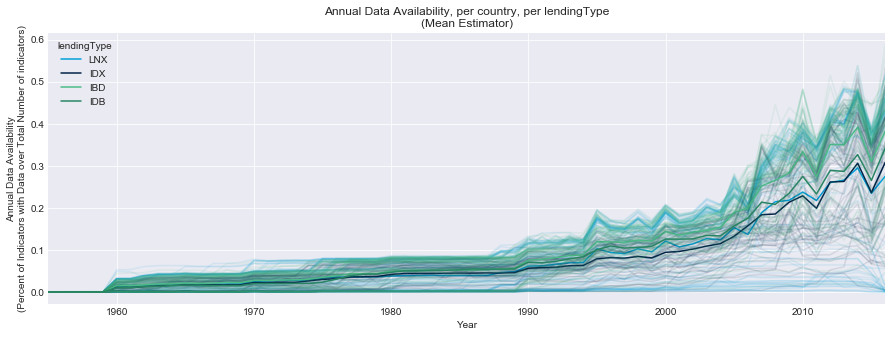

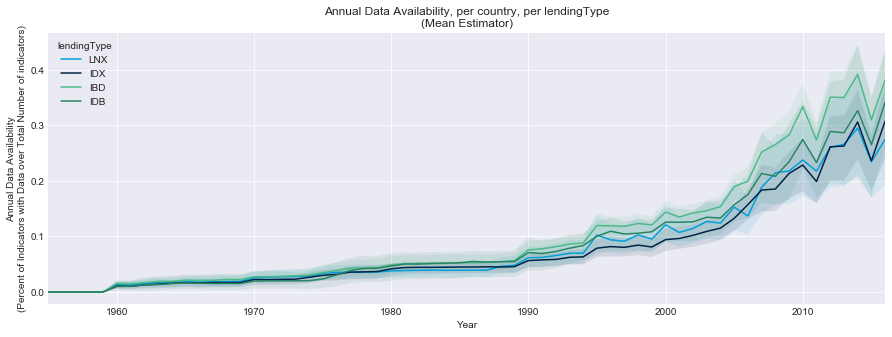

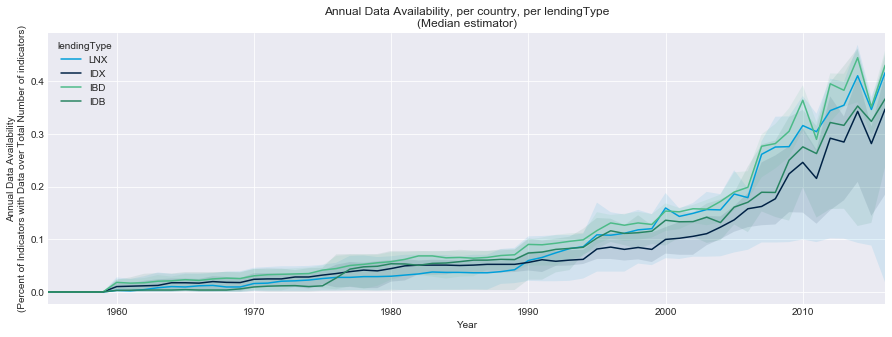

In [127]:
tsplot_bycond(by_country_melt, cond='lendingType')

In [420]:
by_country[by_country['incomeLevel'] == 'INX']

,1919,1920,1921,1922,1923,1924,1925,1926,1927,1928,...,2022,2023,2024,2025,2026,2027,region,incomeLevel,lendingType,cluster
Country ISO3,,,,,,,,,,,,,,,,,,,,,
ARG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00525,0.00252,0.00252,0.00252,0.00252,0.00252,LCN,INX,IBD,2


## Histograms

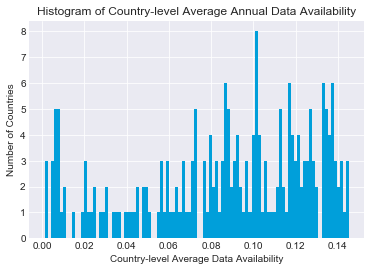

In [134]:
plt.title("Histogram of Country-level Average Annual Data Availability")
plt.ylabel("Number of Countries")
plt.xlabel("Country-level Average Data Availability")
map_by_country['ave_data_avail'].hist(bins=100)

In [135]:
by_country_melt.head()

,Country ISO3,region,incomeLevel,lendingType,cluster,Period,Observation
0,ABW,LCN,HIC,LNX,3,1955,0.0
1,AFG,SAS,LIC,IDX,3,1955,0.0
2,AGO,SSF,UMC,IBD,3,1955,0.0
3,ALB,ECS,UMC,IBD,3,1955,0.0
4,AND,ECS,HIC,LNX,3,1955,0.0


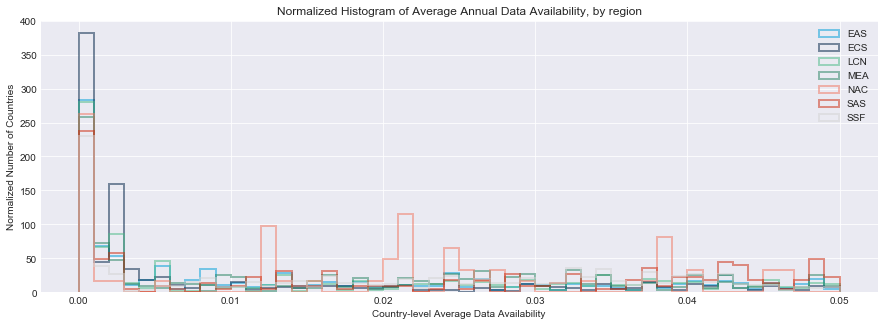

In [136]:
cond = 'region'
fig, ax = plt.subplots(figsize=(15,5))
df_grouped = by_country_melt.groupby(cond)[['Period', 'Observation']]
for label, group in df_grouped:
    group[['Period', 'Observation']].hist(bins = np.arange(0,0.051, 0.001), histtype='step', label = label, ax=ax, alpha=0.5, lw=2, normed=True)
plt.legend()
plt.title("Normalized Histogram of Average Annual Data Availability, by region")
plt.ylabel("Normalized Number of Countries")
plt.xlabel("Country-level Average Data Availability")
plt.show()

## Barplots

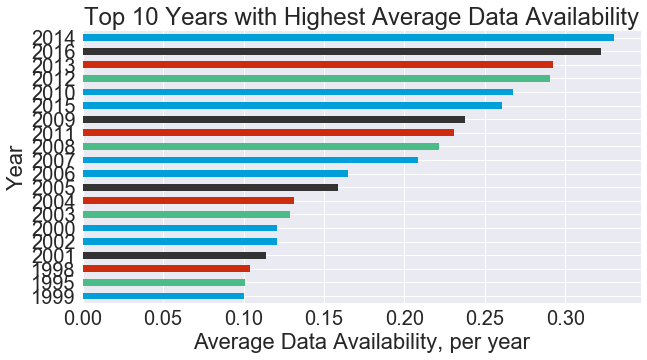

In [25]:
plt.title("Top 10 Years with Highest Average Data Availability")
plt.ylabel("Year")
plt.xlabel("Average Data Availability, per year")
by_country[list_timeframe_all].mean(axis=0).sort_values(ascending=True).tail(20).plot(kind='barh', figsize=(10,5))

In [138]:
by_country[list_timeframe_all].mean(axis=1).sort_values(ascending=False).head(20)

Country ISO3
USA    0.145279
CAN    0.145047
COL    0.143864
BRA    0.143741
KOR    0.142241
ZAF    0.141563
MEX    0.141126
CHL    0.140483
ARG    0.139885
TUR    0.139183
IND    0.138643
SWE    0.138121
THA    0.137760
GBR    0.137663
NLD    0.137604
PHL    0.137390
FRA    0.137285
NOR    0.136665
MYS    0.136469
ISR    0.135650
dtype: float64

In [29]:
(pd.DataFrame(by_country[list_timeframe_all].median(axis=1).sort_values(ascending=False).head(20)).join(pd.DataFrame(df_tc_countries['name'])).set_index('name')*100).to_csv("data/2.1-top20-median-pct.csv")

In [27]:
(pd.DataFrame(by_country[list_timeframe_all].median(axis=1).sort_values(ascending=False).tail(20)).join(pd.DataFrame(df_tc_countries['name'])).set_index('name')*100).to_csv("data/2.2-bottom20-median-pct.csv")

In [30]:
(pd.DataFrame(by_country[list_timeframe_all].median(axis=1).sort_values(ascending=False).tail(20)).join(pd.DataFrame(df_tc_countries['name'])).set_index('name')*100)

,0
name,
Latvia,0.218341
"Micronesia, Fed. Sts.",0.218341
Russian Federation,0.218341
Estonia,0.218341
Marshall Islands,0.181951
Curacao,0.145560
Andorra,0.145560
Bosnia and Herzegovina,0.145560
Eritrea,0.145560


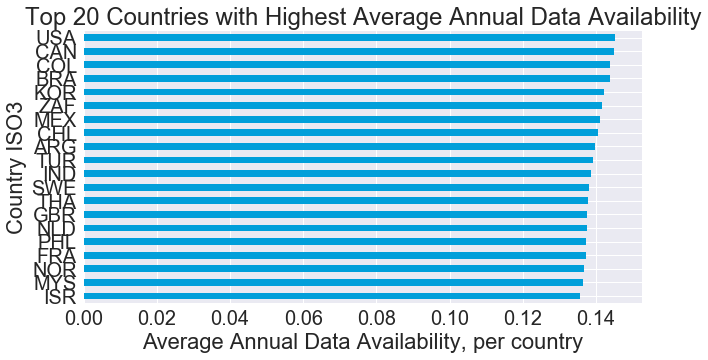

In [47]:
plt.title("Top 20 Countries with Highest Average Annual Data Availability")
plt.ylabel("Country ISO3")
plt.xlabel("Average Annual Data Availability, per country")
by_country[list_timeframe_all].mean(axis=1).sort_values(ascending=True).tail(20).plot(kind='barh', figsize=(10,5))

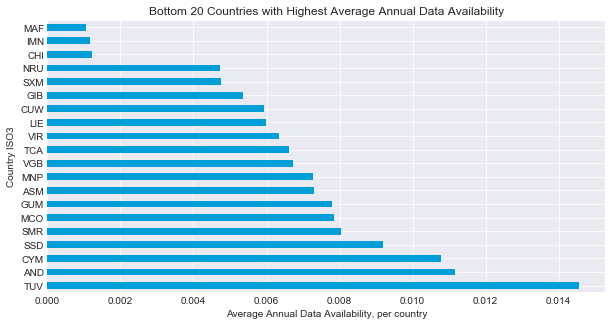

In [47]:
plt.title("Bottom 20 Countries with Highest Average Annual Data Availability")
plt.ylabel("Country ISO3")
plt.xlabel("Average Annual Data Availability, per country")
by_country[list_timeframe_all].mean(axis=1).sort_values(ascending=False).tail(20).plot(kind='barh', figsize=(10,5))

### Follow-up analysis of Top/Bottom 20 countries (median)

In [49]:
top20 = by_country[list_timeframe_all].median(axis=1).sort_values(ascending=False).head(20).index
bottom20 = by_country[list_timeframe_all].median(axis=1).sort_values(ascending=True).head(20).index

print('top 20:',top20)
print('bottom 20:', bottom20)

top 20: Index(['KOR', 'THA', 'USA', 'MEX', 'EGY', 'MYS', 'SGP', 'IDN', 'IND', 'TUN',
       'SWE', 'PAK', 'CRI', 'NOR', 'DZA', 'MAR', 'FRA', 'PHL', 'FIN', 'DNK'],
      dtype='object', name='Country ISO3')
bottom 20: Index(['IMN', 'PLW', 'SXM', 'MAF', 'SSD', 'SRB', 'CHI', 'KSV', 'MNE', 'PSE',
       'TLS', 'ERI', 'BIH', 'AND', 'CUW', 'MHL', 'EST', 'RUS', 'FSM', 'LVA'],
      dtype='object', name='Country ISO3')


In [50]:
df_tc_countries = pd.read_csv("data/countries.csv", encoding='latin-1')

In [51]:
df_tc_countries.head()

,id,iso2,iso3,name,region,adminRegion,incomeLevel,lendingType,capitalCity,aggregate,sids,landlocked,geo.lat,geo.lng
0,AFG,AF,AFG,Afghanistan,SAS,SAS,LIC,IDX,Kabul,False,False,True,34.5228,69.17610
1,ALB,AL,ALB,Albania,ECS,ECA,UMC,IBD,Tirane,False,False,False,41.3317,19.81720
2,DZA,DZ,DZA,Algeria,MEA,MNA,UMC,IBD,Algiers,False,False,False,36.7397,3.05097
3,ASM,AS,ASM,American Samoa,EAS,EAP,UMC,LNX,Pago Pago,False,NaN,NaN,-14.2846,-170.69100
4,AND,AD,AND,Andorra,ECS,NaN,HIC,LNX,Andorra la Vella,False,NaN,NaN,42.5075,1.52180


In [55]:
top20_countries = df_tc_countries[df_tc_countries['id'].isin(top20)]
bot20_countries = df_tc_countries[df_tc_countries['id'].isin(bottom20)]

In [56]:
bot20_countries

,id,iso2,iso3,name,region,adminRegion,incomeLevel,lendingType,capitalCity,aggregate,sids,landlocked,geo.lat,geo.lng
4,AND,AD,AND,Andorra,ECS,NaN,HIC,LNX,Andorra la Vella,False,NaN,NaN,42.50750,1.52180
24,BIH,BA,BIH,Bosnia and Herzegovina,ECS,ECA,UMC,IBD,Sarajevo,False,False,False,43.86070,18.42140
39,CHI,JG,CHI,Channel Islands,ECS,NaN,HIC,LNX,NaN,False,NaN,NaN,NaN,NaN
50,CUW,CW,CUW,Curacao,LCN,NaN,HIC,LNX,Willemstad,False,NaN,NaN,NaN,NaN
61,ERI,ER,ERI,Eritrea,SSF,SSA,LIC,IDX,Asmara,False,False,False,15.33150,38.91830
62,EST,EE,EST,Estonia,ECS,NaN,HIC,LNX,Tallinn,False,False,False,59.43920,24.75860
93,IMN,IM,IMN,Isle of Man,ECS,NaN,HIC,LNX,Douglas,False,NaN,NaN,54.15090,-4.47928
104,KSV,XK,KSV,Kosovo,ECS,ECA,LMC,IDX,Pristina,False,False,True,42.56500,20.92600
108,LVA,LV,LVA,Latvia,ECS,NaN,HIC,LNX,Riga,False,False,False,56.94650,24.10480
124,MHL,MH,MHL,Marshall Islands,EAS,EAP,UMC,IDX,Majuro,False,True,False,7.11046,171.13500


In [58]:
top20_countries["country_rank"] = "top20"
bot20_countries["country_rank"] = "bottom20"

C:\Users\mrpso\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\mrpso\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [59]:
topbot20_countries = pd.concat([top20_countries,bot20_countries])

In [60]:
key_country_columns = ['incomeLevel', 'lendingType', 'landlocked', 'region', 'sids']

In [61]:
df_tc_countries.head()

,id,iso2,iso3,name,region,adminRegion,incomeLevel,lendingType,capitalCity,aggregate,sids,landlocked,geo.lat,geo.lng
0,AFG,AF,AFG,Afghanistan,SAS,SAS,LIC,IDX,Kabul,False,False,True,34.5228,69.17610
1,ALB,AL,ALB,Albania,ECS,ECA,UMC,IBD,Tirane,False,False,False,41.3317,19.81720
2,DZA,DZ,DZA,Algeria,MEA,MNA,UMC,IBD,Algiers,False,False,False,36.7397,3.05097
3,ASM,AS,ASM,American Samoa,EAS,EAP,UMC,LNX,Pago Pago,False,NaN,NaN,-14.2846,-170.69100
4,AND,AD,AND,Andorra,ECS,NaN,HIC,LNX,Andorra la Vella,False,NaN,NaN,42.5075,1.52180


In [62]:
topbot20_countries.head()

,id,iso2,iso3,name,region,adminRegion,incomeLevel,lendingType,capitalCity,aggregate,sids,landlocked,geo.lat,geo.lng,country_rank
2,DZA,DZ,DZA,Algeria,MEA,MNA,UMC,IBD,Algiers,False,False,False,36.73970,3.05097,top20
46,CRI,CR,CRI,Costa Rica,LCN,LAC,UMC,IBD,San Jose,False,False,False,9.63701,-84.00890,top20
53,DNK,DK,DNK,Denmark,ECS,NaN,HIC,LNX,Copenhagen,False,False,False,55.67630,12.56810,top20
58,EGY,EG,EGY,"Egypt, Arab Rep.",MEA,MNA,LMC,IBD,Cairo,False,False,False,30.09820,31.24610,top20
66,FIN,FI,FIN,Finland,ECS,NaN,HIC,LNX,Helsinki,False,False,False,60.16080,24.95250,top20


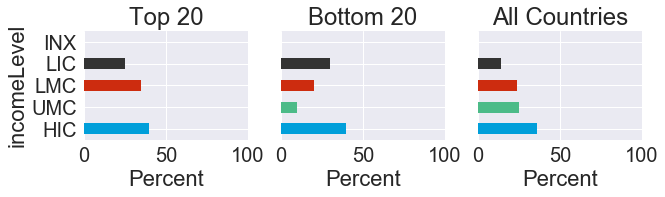

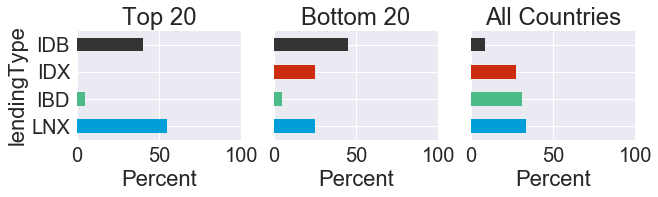

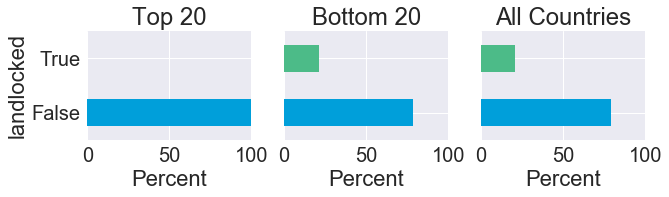

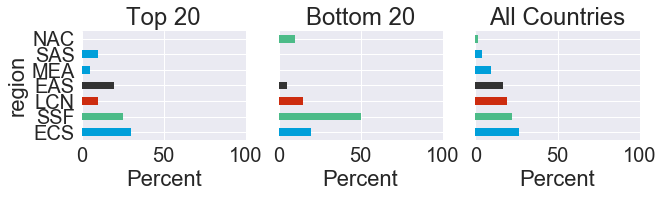

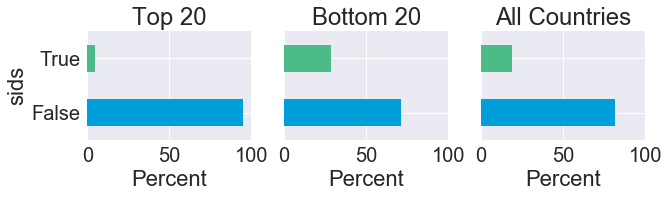

In [63]:
for col in key_country_columns:
    df_temp = topbot20_countries.groupby("country_rank")[col].value_counts(normalize=True).unstack(level=0).fillna(0)*100
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(10,2))
    df_temp['top20'].plot(kind="barh", ax=ax1)
    ax1.set_title('Top 20')
    ax1.set_xlim(0,100)
    ax1.set_xlabel("Percent")

    df_temp['bottom20'].plot(kind="barh", ax=ax2)
    ax2.set_title('Bottom 20')
    ax2.set_xlim(0,100)
    ax2.set_xlabel("Percent")
    
    df_all = df_tc_countries[col].value_counts(normalize=True)*100
    df_all.plot(kind="barh", ax=ax3)
    ax3.set_title('All Countries')
    ax3.set_xlim(0,100)
    ax3.set_xlabel("Percent")
    
    plt.show()

## Clustering country-level timeseries

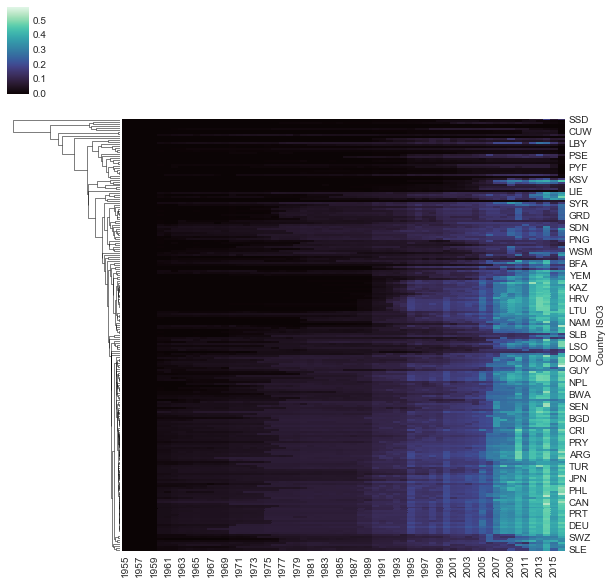

In [36]:
g = sns.clustermap(by_country[list_timeframe_all], cmap="mako", metric ='cosine', col_cluster=False)

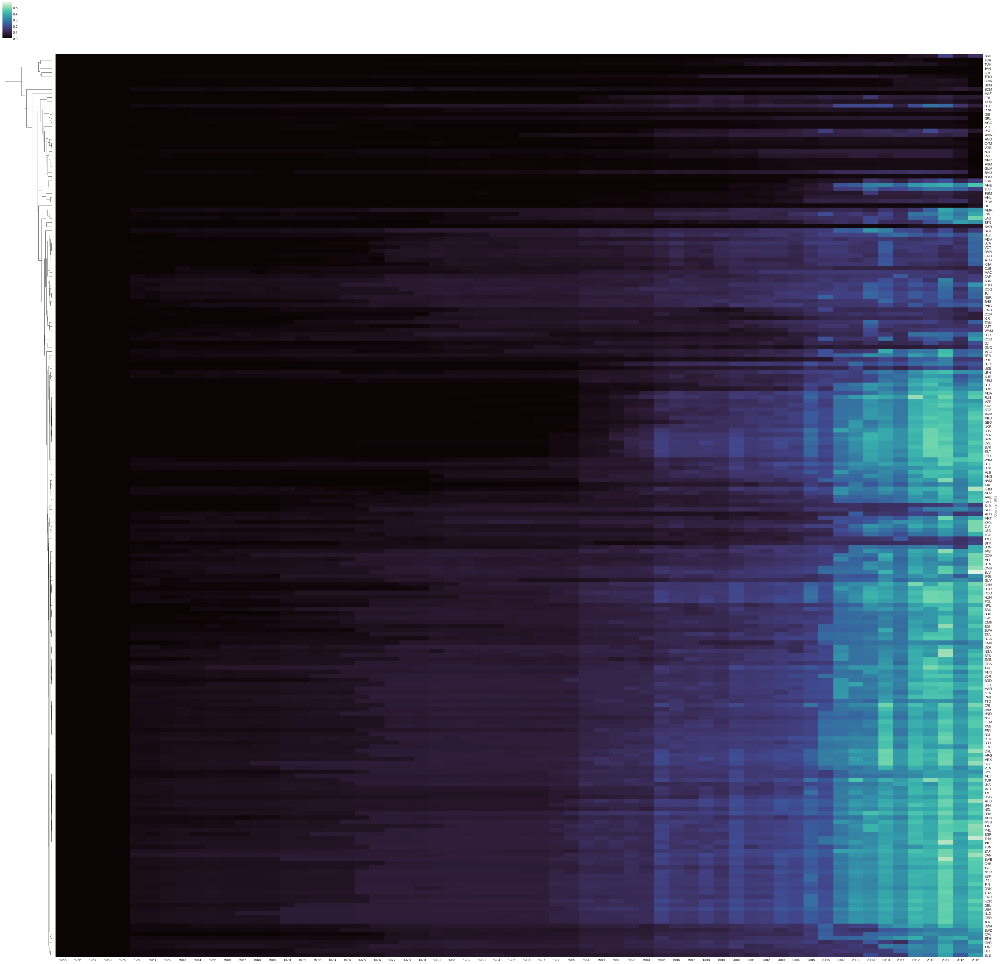

In [37]:
g = sns.clustermap(by_country[list_timeframe_all], cmap="mako", metric ='cosine', col_cluster=False, figsize=(50,50))

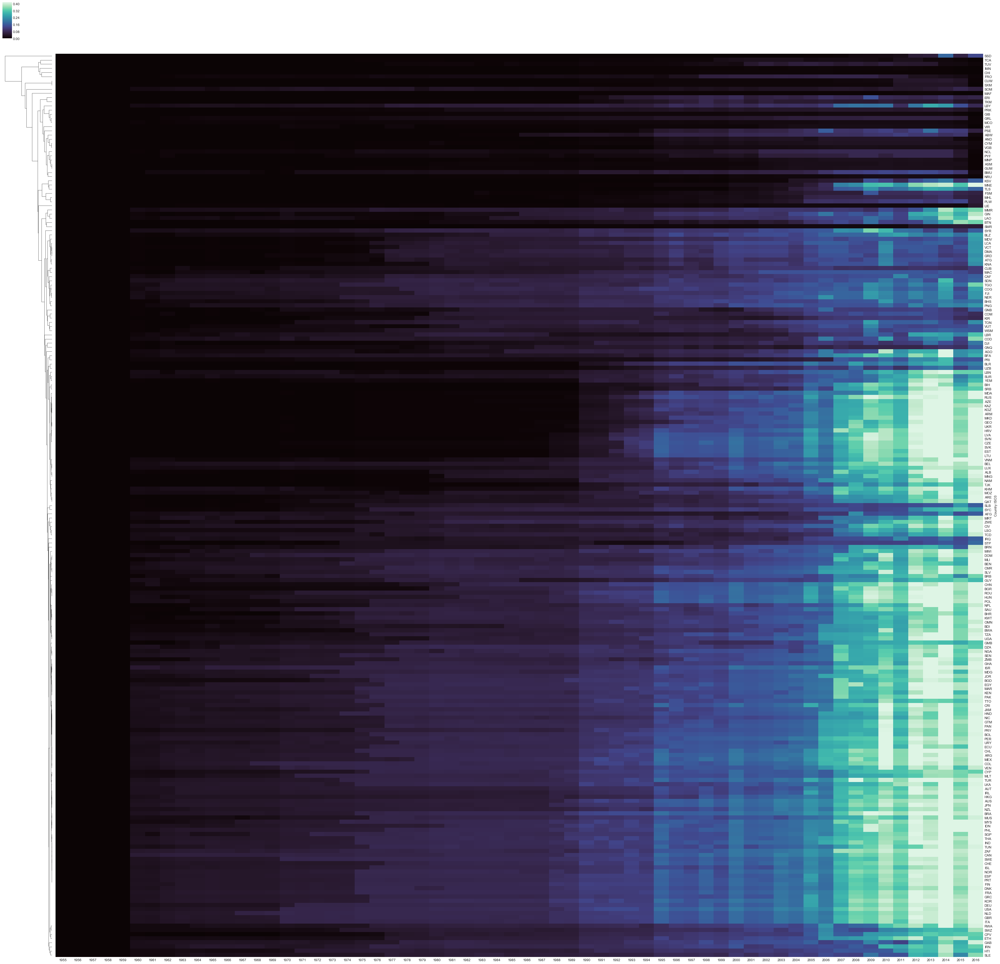

In [38]:
g = sns.clustermap(by_country[list_timeframe_all], cmap="mako", metric ='cosine', robust=True, col_cluster=False, figsize=(50,50)) #ignores outliers

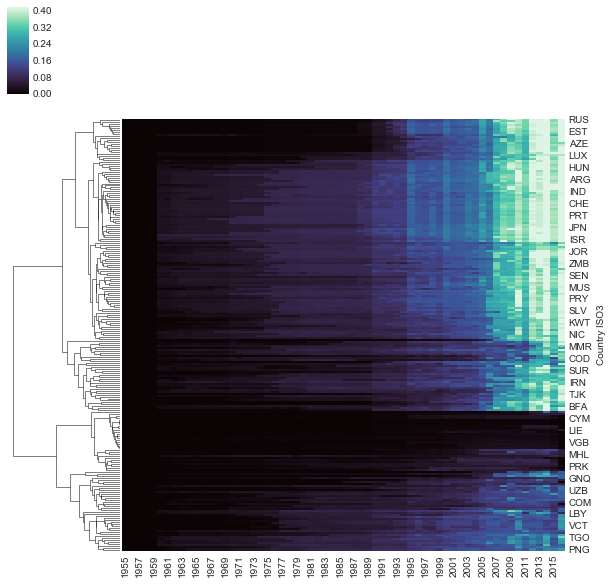

In [39]:
g = sns.clustermap(by_country[list_timeframe_all], cmap="mako", robust=True, col_cluster=False) #ignores outliers

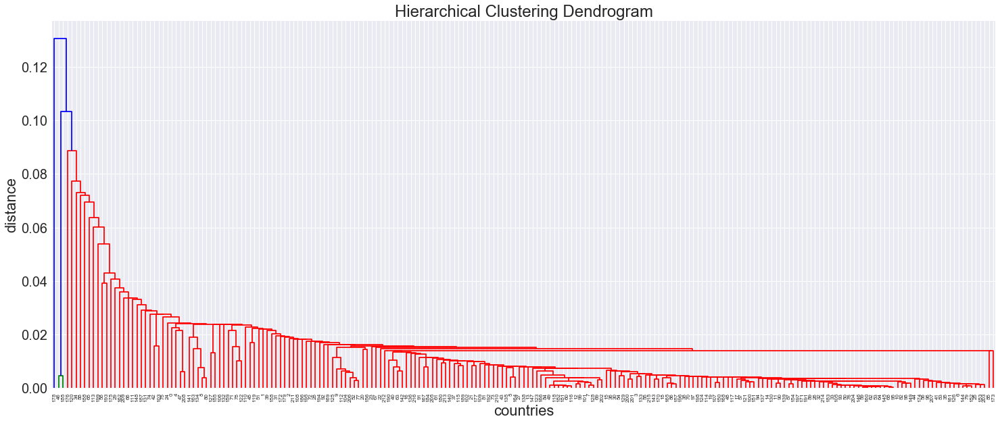

In [70]:
Z = hac.linkage(by_country[list_timeframe_all], 'single', 'cosine')

# Plot the dendogram
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('countries')
plt.ylabel('distance')
hac.dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
)
plt.show()

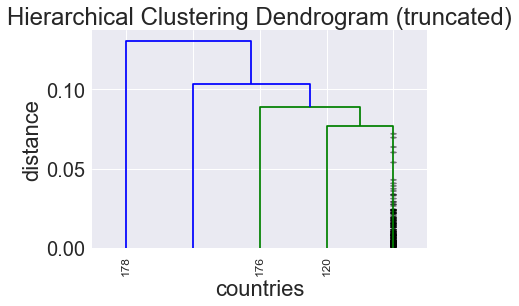

In [71]:
plt.title('Hierarchical Clustering Dendrogram (truncated)')
plt.xlabel('countries')
plt.ylabel('distance')
hac.dendrogram(
    Z,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=5,  # show only the last p merged clusters
    show_leaf_counts=False,  # otherwise numbers in brackets are counts
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,  # to get a distribution impression in truncated branches
)
plt.show()

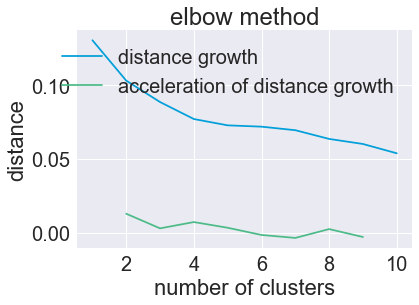

clusters: 2


In [72]:
last = Z[-10:, 2]
last_rev = last[::-1]
idxs = np.arange(1, len(last) + 1)
plt.plot(idxs, last_rev, label='distance growth')

acceleration = np.diff(last, 2)  # 2nd derivative of the distances
acceleration_rev = acceleration[::-1]
plt.plot(idxs[:-2] + 1, acceleration_rev, label="acceleration of distance growth")
plt.legend()
plt.xlabel("number of clusters")
plt.ylabel("distance")
plt.title("elbow method")
plt.show()
k = acceleration_rev.argmax() + 2  # if idx 0 is the max of this we want 2 clusters
print("clusters:", k)

In [73]:
def generate_clusters(Z, param, criterion='maxclust'):
    by_country['cluster'] = hac.fcluster(Z, param, criterion=criterion)
    by_country_melt = pd.melt(by_country.reset_index(),id_vars = ['Country ISO3','region', 'incomeLevel', 'lendingType','cluster'], 
                              value_vars = list_timeframe_all, var_name="Period", value_name='Observation')
    plt.figure(figsize=(15,5))
    sns.tsplot(data=by_country_melt, time='Period', value='Observation', unit='Country ISO3', condition = 'cluster',
               err_style="unit_traces", err_kws = {'alpha': 0.05})
    plt.title("Cluster cutoff determined by %s = %0.2f" % (criterion, param))
    
    check_temp = pd.DataFrame(by_country['cluster'].value_counts()).reset_index()
    check_temp.columns = ['cluster', 'number_of_members']
    check_temp.set_index("cluster", inplace=True)
    check_temp = check_temp.join(pd.DataFrame(by_country.reset_index().groupby(['cluster'])['Country ISO3'].apply(lambda x: list(x))))
    check_temp.sort_index()
    return(by_country_melt, check_temp.sort_index())

### Based on Elbow Method

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



,number_of_members,Country ISO3
cluster,,
1,216,"[ABW, AFG, AGO, ALB, AND, ARE, ARG, ARM, ASM, ..."
2,1,[SSD]


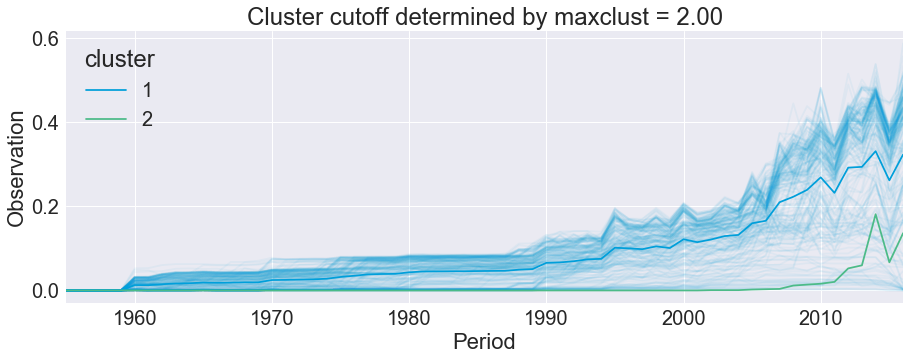

In [76]:
by_country_melt, check_temp = generate_clusters(Z, 2, criterion='maxclust')
check_temp

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



,number_of_members,Country ISO3
cluster,,
1,2,"[CUW, SXM]"
2,214,"[ABW, AFG, AGO, ALB, AND, ARE, ARG, ARM, ASM, ..."
3,1,[SSD]


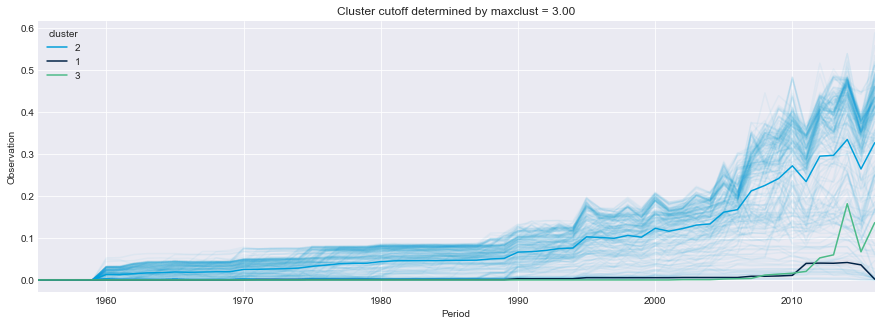

In [91]:
by_country_melt, check_temp = generate_clusters(Z, 3, criterion='maxclust')
check_temp

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



,number_of_members,Country ISO3
cluster,,
1,2,"[CUW, SXM]"
2,213,"[ABW, AFG, AGO, ALB, AND, ARE, ARG, ARM, ASM, ..."
3,1,[SOM]
4,1,[SSD]


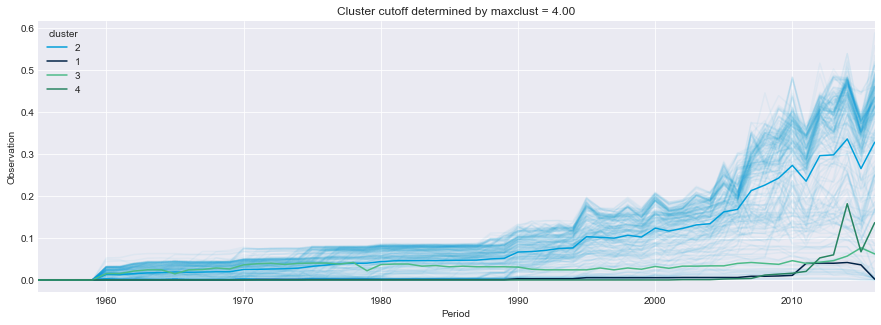

In [92]:
by_country_melt, check_temp = generate_clusters(Z, 4, criterion='maxclust')
check_temp

### Based on Max Distance

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



,number_of_members,Country ISO3
cluster,,
1,2,"[CUW, SXM]"
2,2,"[ERI, TKM]"
3,203,"[ABW, AFG, AGO, ALB, AND, ARE, ARG, ARM, ASM, ..."
4,1,[SMR]
5,1,[TUV]
6,1,[LIE]
7,1,[FRO]
8,1,[TCA]
9,1,[IMN]


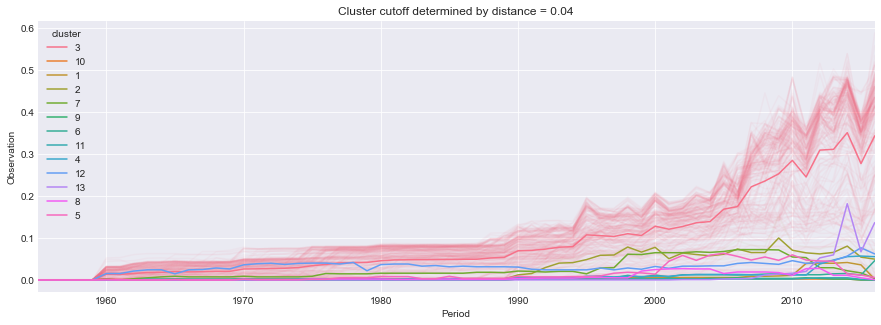

In [115]:
by_country_melt, check_temp = generate_clusters(Z, 0.04, criterion='distance')
check_temp

## Choropleth Map

In [129]:
map_by_country = by_country[list_timeframe_all].mean(axis=1)
map_by_country = pd.concat([map_by_country, df_tc_countries['name']], axis=1)
map_by_country = map_by_country.reset_index()
map_by_country.columns = ['iso3', 'ave_data_avail', 'name']

In [130]:
map_by_country.head()

,iso3,ave_data_avail,name
0,ABW,0.036138,Aruba
1,AFG,0.056909,Afghanistan
2,AGO,0.077464,Angola
3,ALB,0.099192,Albania
4,AND,0.011152,Andorra


In [131]:
init_notebook_mode(connected=True)

In [133]:
data = [ dict(
        type = 'choropleth',
        locations = map_by_country['iso3'],
        z = map_by_country['ave_data_avail'],
        text = map_by_country['name'],
        colorscale = [[0,"rgb(5, 10, 172)"],[0.25,"rgb(70, 100, 245)"],[0.5,"rgb(106, 137, 247)"],[1.0,"rgb(220, 220, 220)"]],
        autocolorscale = False,
        reversescale = True,
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            ) ),
        colorbar = dict(
            autotick = False,
            ticksuffix = '%',
            title = 'Ave. Annual<br>Data Availability<br>Percent(%)'),
      ) ]

layout = dict(
    title = 'Average Annual Data Availability, by Country',
    geo = dict(
        showframe = False,
        showcoastlines = False,
        projection = dict(
            type = 'Mercator'
        )
    )
)

fig = dict( data=data, layout=layout )
iplot( fig, validate=False, filename='d3-world-map' )

# Topic-level Data Analysis

In [10]:
df_merged2.head()

,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,...,2012,2013,2014,2015,2016,Country ISO3,dataset_id,indicatorId,topiclvl1,topiclvl2
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,228.0,Investment,Entry and Investment
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,276.0,Innovation,Firm Dynamics
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,277.0,Innovation,Firm Dynamics
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,280.0,Investment,Risk and Policy Uncertainty
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,279.0,Investment,Risk and Policy Uncertainty


In [11]:
total_indicators_per_topic = df_merged2.groupby(['topiclvl1'])['indicatorId'].apply(lambda x: len(x.unique()))
total_indicators_per_topic

topiclvl1
Innovation    213
Investment    521
Sectors        90
Trade         550
Name: indicatorId, dtype: int64

In [12]:
by_topic = (df_merged2.groupby(['topiclvl1', 'Country ISO3'])[list_timeframe_all].sum().unstack(level=0).fillna(0).mean().unstack(level=-1)/total_indicators_per_topic).T

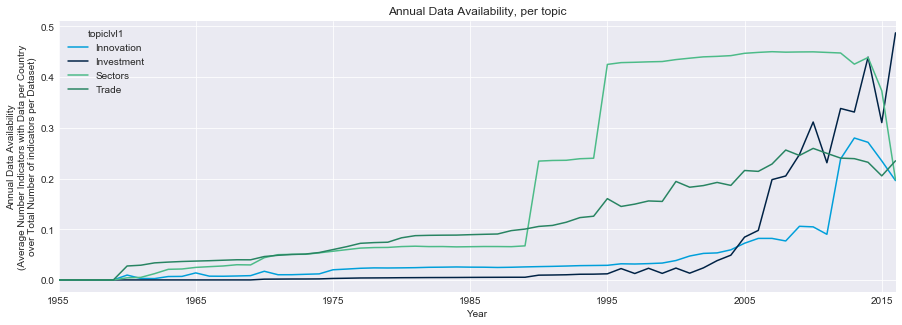

In [13]:
by_topic[list_timeframe_all].T.plot(figsize=(15,5))
plt.title("Annual Data Availability, per topic")
plt.ylabel("Annual Data Availability\n(Average Number Indicators with Data per Country\nover Total Number of indicators per Dataset)")
plt.xlabel("Year")

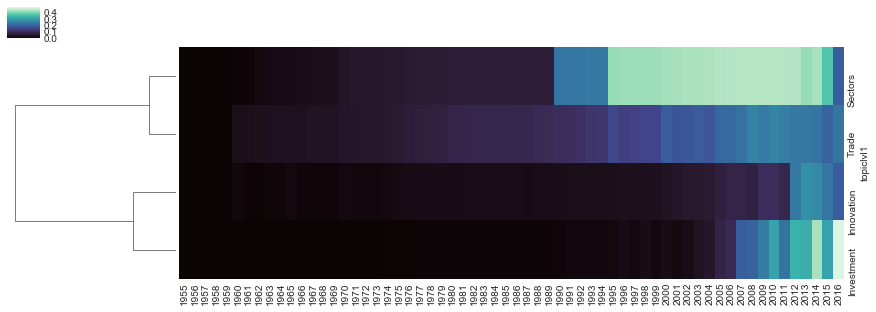

In [149]:
g = sns.clustermap(by_topic[list_timeframe_all], cmap="mako", col_cluster=False, metric ='cosine', figsize=(15,5))

# Subtopic-level Data Analysis

In [14]:
df_merged2.head()

,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,...,2012,2013,2014,2015,2016,Country ISO3,dataset_id,indicatorId,topiclvl1,topiclvl2
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,228.0,Investment,Entry and Investment
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,276.0,Innovation,Firm Dynamics
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,277.0,Innovation,Firm Dynamics
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,280.0,Investment,Risk and Policy Uncertainty
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,279.0,Investment,Risk and Policy Uncertainty


In [15]:
df_merged2['topiclvl2'].value_counts()

Reform Progress                       38675
Trade Outcomes                        37801
Trade Facilitation                    18211
Entrepreneurship                      13833
Entry and Investment                  12312
Risk and Policy Uncertainty            9595
Cost of Operations                     8751
Trade Barriers                         8528
Tourism                                8134
Perceived Constraints                  6035
E-trade                                4098
Manufacturing                          3795
Innovation Inputs                      3081
Competition and Competition Policy     2486
Innovation Outputs                     2431
Climate Competitiveness                1735
Firm Dynamics                          1305
Connectivity                           1208
Name: topiclvl2, dtype: int64

In [16]:
len(df_merged2['topiclvl2'].unique())

18

In [17]:
df_merged2[['topiclvl1','topiclvl2']].drop_duplicates().shape

(18, 2)

In [18]:
total_indicators_per_subtopic = df_merged2.groupby(['topiclvl2'])['indicatorId'].apply(lambda x: len(x.unique()))
total_indicators_per_subtopic

topiclvl2
Climate Competitiveness                11
Competition and Competition Policy     39
Connectivity                            7
Cost of Operations                     82
E-trade                                27
Entrepreneurship                      106
Entry and Investment                   85
Firm Dynamics                          13
Innovation Inputs                      75
Innovation Outputs                     19
Manufacturing                          27
Perceived Constraints                  43
Reform Progress                       253
Risk and Policy Uncertainty            58
Tourism                                52
Trade Barriers                         73
Trade Facilitation                    168
Trade Outcomes                        236
Name: indicatorId, dtype: int64

In [19]:
by_subtopic = (df_merged2.groupby(['topiclvl2', 'Country ISO3'])[list_timeframe_all].sum().unstack(level=0).fillna(0).mean().unstack(level=-1)/total_indicators_per_subtopic).T

In [20]:
topic_hier = df_merged2[['topiclvl1','topiclvl2']].drop_duplicates().set_index('topiclvl2')

In [21]:
by_subtopic = by_subtopic.join(topic_hier)

In [22]:
by_subtopic.head()

,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,topiclvl1
topiclvl2,,,,,,,,,,,,,,,,,,,,,
Climate Competitiveness,0.0,0.0,0.0,0.0,0.0,0.021366,0.028488,0.028907,0.029326,0.030582,...,0.497277,0.496439,0.494763,0.498115,0.496020,0.346041,0.547549,0.134059,0.106410,Sectors
Competition and Competition Policy,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.235141,0.054709,0.101382,0.057308,0.129623,0.229588,0.120288,0.049628,0.094056,Trade
Connectivity,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.410797,0.429230,0.536537,0.397630,0.456221,0.326531,0.369980,0.194207,0.309414,Trade
Cost of Operations,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.081994,0.149151,0.137406,0.113128,0.112116,0.162808,0.234686,0.197819,0.201304,Investment
E-trade,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.078512,0.099676,0.201570,0.129544,0.232463,0.152586,0.339990,0.238266,0.369688,Trade


C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



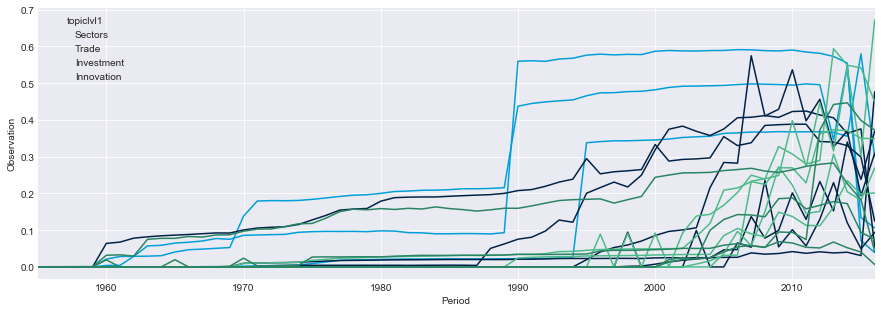

In [225]:
sns.set_palette(wbg_cat_pal)

by_subtopic_melt = pd.melt(by_subtopic.reset_index(),id_vars = ['topiclvl2', 'topiclvl1'], 
                          value_vars = list_timeframe_all, var_name="Period", value_name='Observation')
plt.figure(figsize=(15,5))
sns.tsplot(data=by_subtopic_melt, time='Period', value='Observation', unit='topiclvl2', condition = 'topiclvl1',
           err_style="unit_traces", lw=0, err_kws = {'alpha': 1.0})

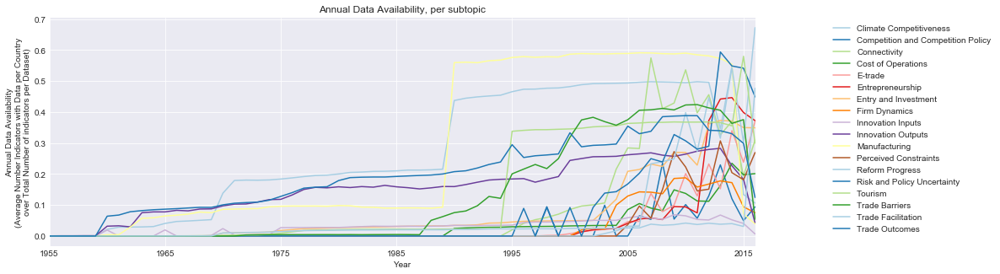

In [23]:
sns.set_palette(sns.color_palette("Paired", 16))
by_subtopic[list_timeframe_all].T.plot(figsize=(15,5))
plt.title("Annual Data Availability, per subtopic")
plt.ylabel("Annual Data Availability\n(Average Number Indicators with Data per Country\nover Total Number of indicators per Dataset)")
plt.xlabel("Year")
plt.legend(loc='best', bbox_to_anchor=(1.1,1))

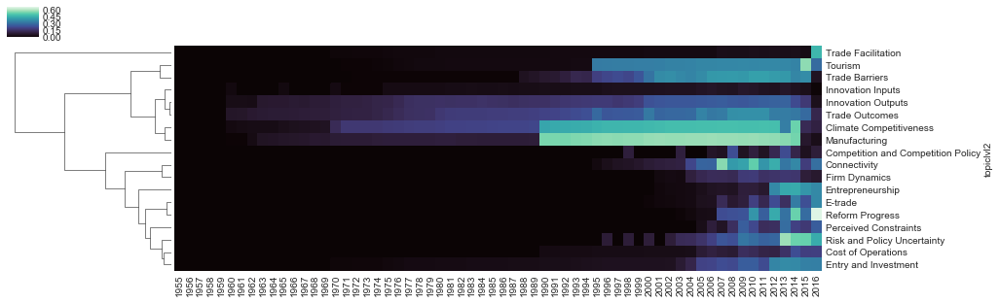

In [164]:
g = sns.clustermap(by_subtopic[list_timeframe_all], cmap="mako", col_cluster=False, metric ='cosine', figsize=(15,5))

## Subtopic-level Clusters

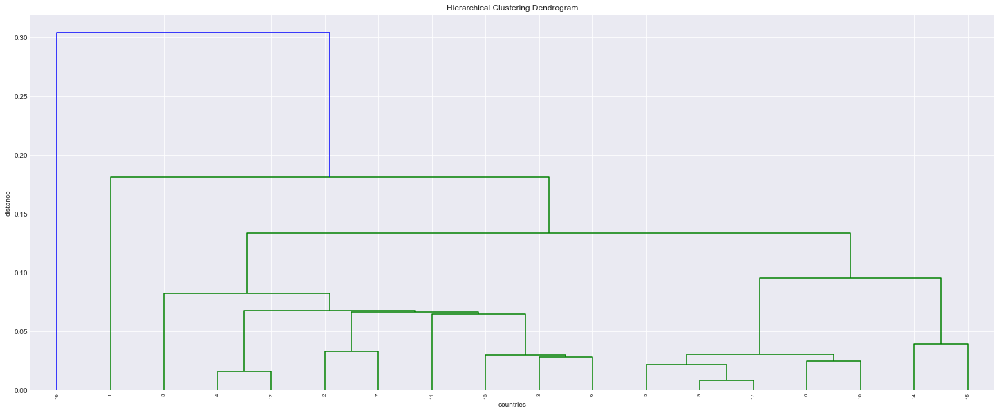

In [172]:
Z = hac.linkage(by_subtopic[list_timeframe_all], 'single', 'cosine')

# Plot the dendogram
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('countries')
plt.ylabel('distance')
hac.dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
)
plt.show()

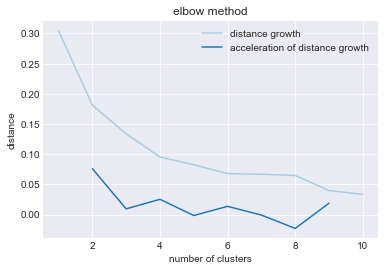

clusters: 2


In [173]:
last = Z[-10:, 2]
last_rev = last[::-1]
idxs = np.arange(1, len(last) + 1)
plt.plot(idxs, last_rev, label='distance growth')

acceleration = np.diff(last, 2)  # 2nd derivative of the distances
acceleration_rev = acceleration[::-1]
plt.plot(idxs[:-2] + 1, acceleration_rev, label="acceleration of distance growth")
plt.legend()
plt.xlabel("number of clusters")
plt.ylabel("distance")
plt.title("elbow method")
plt.show()
k = acceleration_rev.argmax() + 2  # if idx 0 is the max of this we want 2 clusters
print("clusters:", k)

In [188]:
def generate_clusters_subtopic(Z, param, criterion='maxclust'):
    by_subtopic['cluster'] = hac.fcluster(Z, param, criterion=criterion)
    by_subtopic_melt = pd.melt(by_subtopic.reset_index(),id_vars = ['topiclvl2', 'cluster'], 
                              value_vars = list_timeframe_all, var_name="Period", value_name='Observation')
    plt.figure(figsize=(15,5))
    sns.tsplot(data=by_subtopic_melt, time='Period', value='Observation', unit='topiclvl2', condition = 'cluster',
               err_style="unit_traces", err_kws = {'alpha': 0.25})
    plt.title("Cluster cutoff determined by %s = %0.2f" % (criterion, param))
    
    check_temp = pd.DataFrame(by_subtopic['cluster'].value_counts()).reset_index()
    check_temp.columns = ['cluster', 'number_of_members']
    check_temp.set_index("cluster", inplace=True)
    check_temp = check_temp.join(pd.DataFrame(by_subtopic.reset_index().groupby(['cluster'])['topiclvl2'].apply(lambda x: list(x))))
    return(by_subtopic_melt, check_temp.sort_index())

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



,number_of_members,topiclvl2
cluster,,
1,8,"[Connectivity, Cost of Operations, E-trade, En..."
2,1,[Entrepreneurship]
3,5,"[Climate Competitiveness, Innovation Inputs, I..."
4,2,"[Tourism, Trade Barriers]"
5,1,[Competition and Competition Policy]
6,1,[Trade Facilitation]


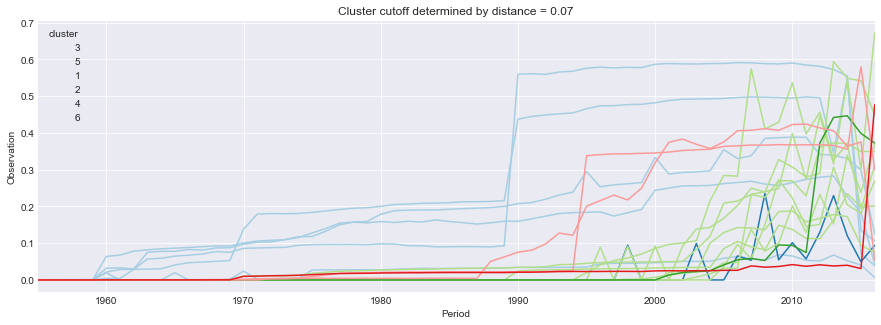

In [197]:
param = 0.07
criterion='distance'

by_subtopic['cluster'] = hac.fcluster(Z, param, criterion=criterion)
by_subtopic_melt = pd.melt(by_subtopic.reset_index(),id_vars = ['topiclvl2', 'cluster'], 
                          value_vars = list_timeframe_all, var_name="Period", value_name='Observation')
plt.figure(figsize=(15,5))
sns.tsplot(data=by_subtopic_melt, time='Period', value='Observation', unit='topiclvl2', condition = 'cluster',
           err_style="unit_traces", lw=0, err_kws = {'alpha': 1.0})
plt.title("Cluster cutoff determined by %s = %0.2f" % (criterion, param))

check_temp = pd.DataFrame(by_subtopic['cluster'].value_counts()).reset_index()
check_temp.columns = ['cluster', 'number_of_members']
check_temp.set_index("cluster", inplace=True)
check_temp = check_temp.join(pd.DataFrame(by_subtopic.reset_index().groupby(['cluster'])['topiclvl2'].apply(lambda x: list(x))))
check_temp.sort_index()

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



,number_of_members,topiclvl2
cluster,,
1,2,"[E-trade, Reform Progress]"
2,2,"[Connectivity, Firm Dynamics]"
3,3,"[Cost of Operations, Entry and Investment, Ris..."
4,1,[Perceived Constraints]
5,1,[Entrepreneurship]
6,5,"[Climate Competitiveness, Innovation Inputs, I..."
7,2,"[Tourism, Trade Barriers]"
8,1,[Competition and Competition Policy]
9,1,[Trade Facilitation]


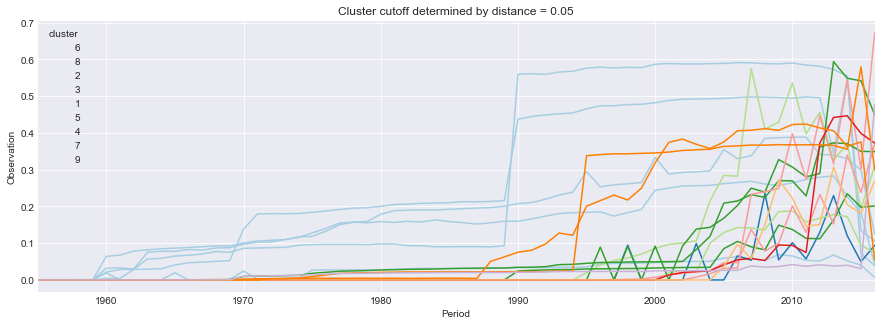

In [221]:
param = 0.05
criterion='distance'

by_subtopic['cluster'] = hac.fcluster(Z, param, criterion=criterion)
by_subtopic_melt = pd.melt(by_subtopic.reset_index(),id_vars = ['topiclvl2', 'cluster'], 
                          value_vars = list_timeframe_all, var_name="Period", value_name='Observation')
plt.figure(figsize=(15,5))
sns.tsplot(data=by_subtopic_melt, time='Period', value='Observation', unit='topiclvl2', condition = 'cluster',
           err_style="unit_traces", lw=0, err_kws = {'alpha': 1.0})
plt.title("Cluster cutoff determined by %s = %0.2f" % (criterion, param))

check_temp = pd.DataFrame(by_subtopic['cluster'].value_counts()).reset_index()
check_temp.columns = ['cluster', 'number_of_members']
check_temp.set_index("cluster", inplace=True)
check_temp = check_temp.join(pd.DataFrame(by_subtopic.reset_index().groupby(['cluster'])['topiclvl2'].apply(lambda x: list(x))))
check_temp.sort_index()

In [208]:
check_temp.loc[6]['topiclvl2']

['Climate Competitiveness',
 'Innovation Inputs',
 'Innovation Outputs',
 'Manufacturing',
 'Trade Outcomes']

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



,number_of_members,topiclvl2
cluster,,
1,8,"[Connectivity, Cost of Operations, E-trade, En..."
2,1,[Entrepreneurship]
3,5,"[Climate Competitiveness, Innovation Inputs, I..."
4,2,"[Tourism, Trade Barriers]"
5,1,[Competition and Competition Policy]
6,1,[Trade Facilitation]


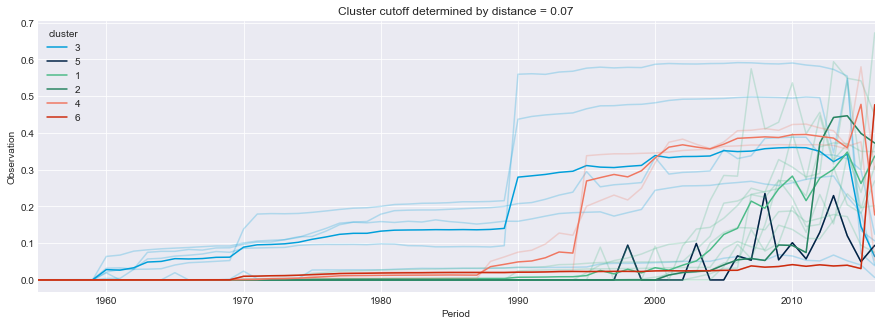

In [266]:
by_subtopic_melt, check_temp = generate_clusters_subtopic(Z, param=0.07, criterion='distance')
check_temp

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



,number_of_members,topiclvl2
cluster,,
1,2,"[E-trade, Reform Progress]"
2,2,"[Connectivity, Firm Dynamics]"
3,3,"[Cost of Operations, Entry and Investment, Ris..."
4,1,[Perceived Constraints]
5,1,[Entrepreneurship]
6,5,"[Climate Competitiveness, Innovation Inputs, I..."
7,2,"[Tourism, Trade Barriers]"
8,1,[Competition and Competition Policy]
9,1,[Trade Facilitation]


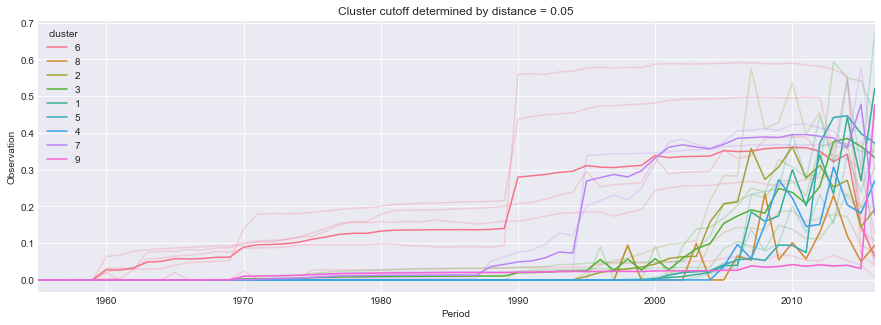

In [269]:
by_subtopic_melt, check_temp = generate_clusters_subtopic(Z, param=0.05, criterion='distance')
check_temp

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



,number_of_members,topiclvl2
cluster,,
1,17,"[Climate Competitiveness, Competition and Comp..."
2,1,[Trade Facilitation]


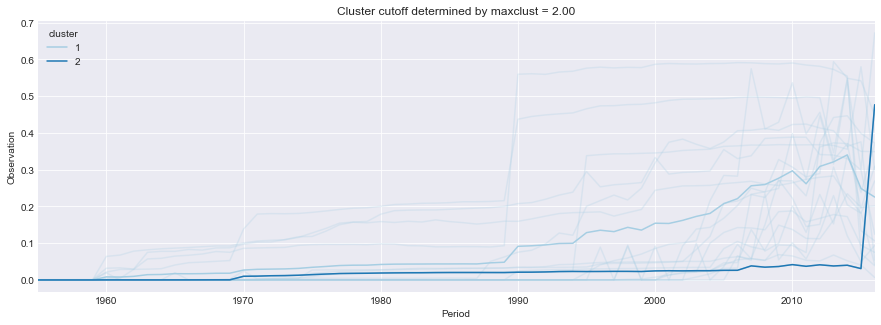

In [190]:
by_subtopic_melt, check_temp = generate_clusters_subtopic(Z, param=2)
check_temp

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



,number_of_members,topiclvl2
cluster,,
1,9,"[Connectivity, Cost of Operations, E-trade, En..."
2,7,"[Climate Competitiveness, Innovation Inputs, I..."
3,1,[Competition and Competition Policy]
4,1,[Trade Facilitation]


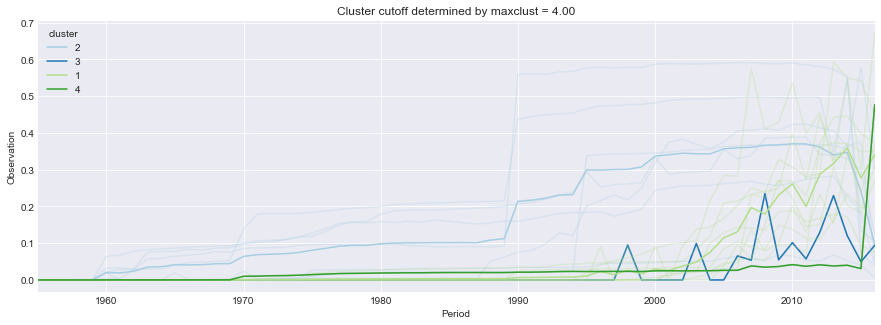

In [191]:
by_subtopic_melt, check_temp = generate_clusters_subtopic(Z, param=4)
check_temp

## Looking at Clusters for MaxDist = 0.05

In [270]:
cluster_list = sorted(list(by_subtopic['cluster'].unique()))

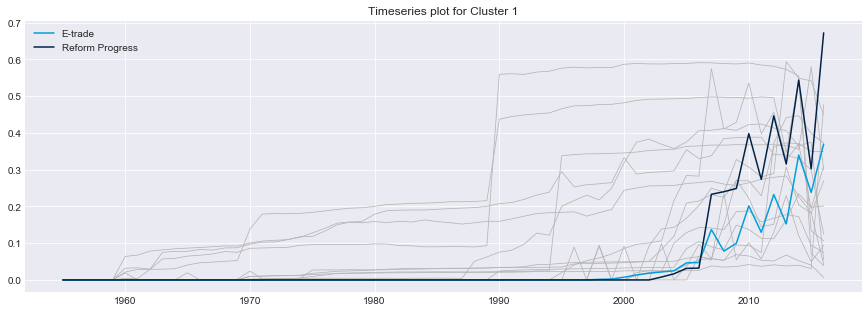

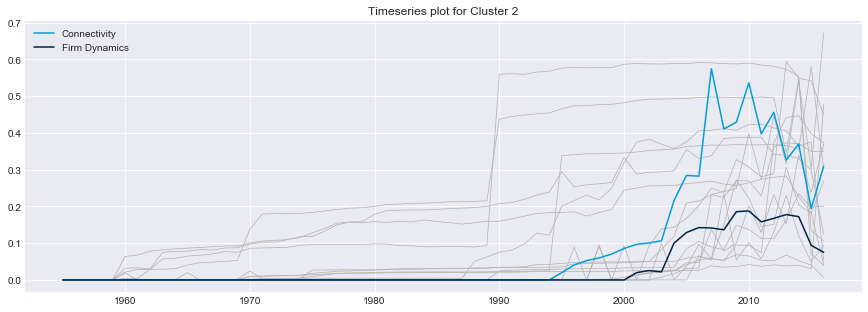

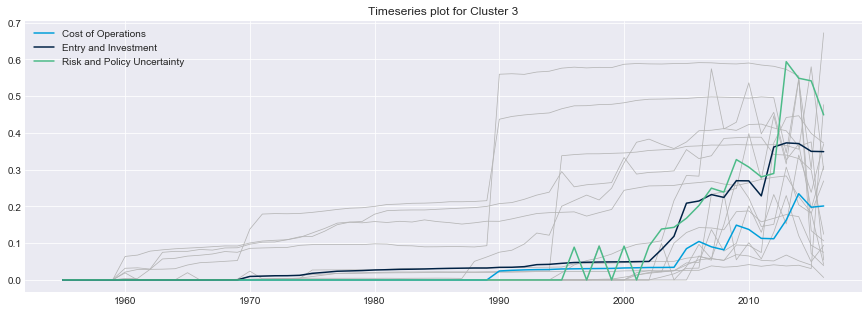

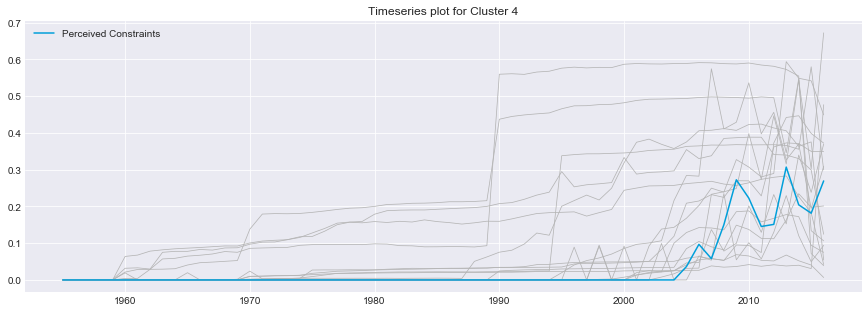

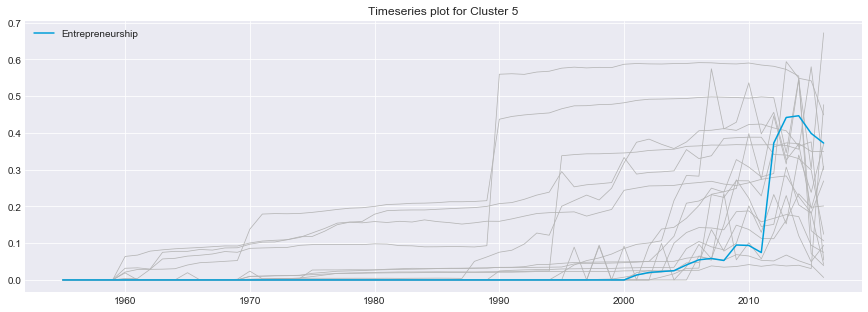

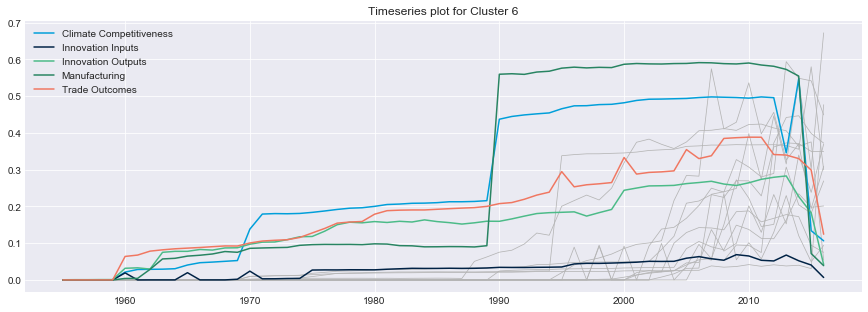

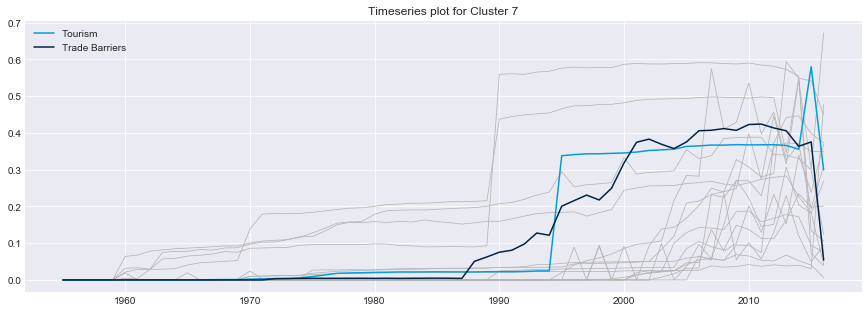

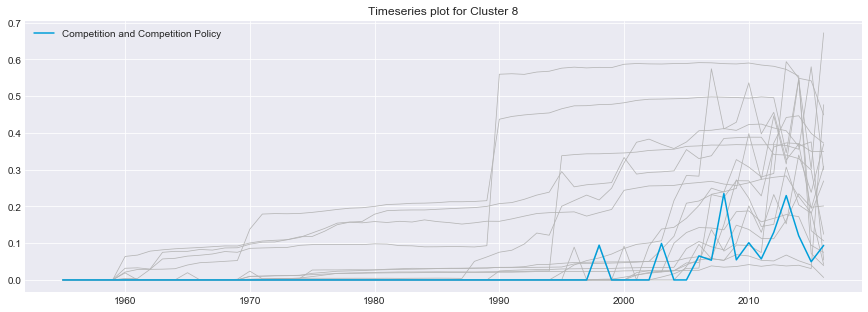

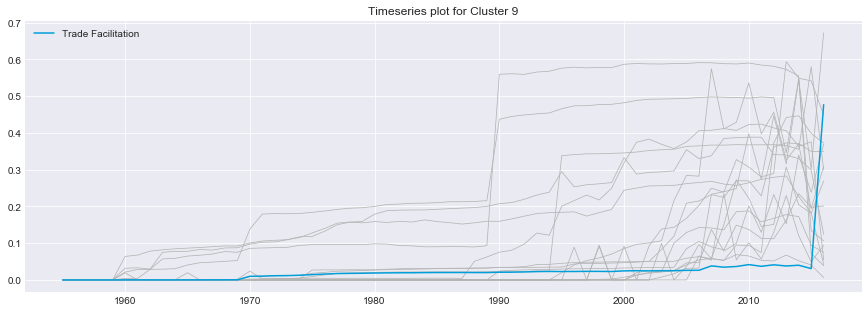

In [271]:
for cluster in cluster_list:
    plt.figure(figsize=(15,5))
    temp = by_subtopic[by_subtopic['cluster'] == cluster]
    plt.plot(by_subtopic[by_subtopic['cluster'] != cluster][list_timeframe_all].T, color='#b4b4b4', lw=0.75)
    for topic in temp[list_timeframe_all].T.columns:
        plt.plot(temp[list_timeframe_all].T[topic], label=topic)
    plt.legend()
    plt.title("Timeseries plot for Cluster %d" % cluster)
    plt.show()

#  Topic- and Subtopic-level timeseries, in slices

In [59]:
topic_list = df_merged2['topiclvl1'].unique()

In [60]:
subtopic_list = df_merged2['topiclvl2'].unique()

In [62]:
print("Topics:",len(topic_list),"and Subtopics:", len(subtopic_list))

Topics: 4 and Subtopics: 18


In [63]:
df_merged2.head()

,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,...,2012,2013,2014,2015,2016,Country ISO3,dataset_id,indicatorId,topiclvl1,topiclvl2
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,228.0,Investment,Entry and Investment
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,276.0,Innovation,Firm Dynamics
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,277.0,Innovation,Firm Dynamics
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,280.0,Investment,Risk and Policy Uncertainty
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,279.0,Investment,Risk and Policy Uncertainty


In [153]:
handle = "topiclvl1"
topic = "Investment"


,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
dataset_id,,,,,,,,,,,,,,,,,,,,,
47,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.389100,0.000000,0.000000,0.000000,0.000000
48,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.264383,0.000000,0.274787,0.000000,0.458595,0.000000,0.688870
49,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.077116,0.034883,0.237006,0.158607,0.027183,0.013708,0.224873,0.054308,0.041416,0.057866
51,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.927803,0.930876,0.935484,0.936252,0.940092,0.940092,0.940092,0.935484,0.935484,0.000000
52,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.402002,0.404162,0.471342,0.471486,0.489487,0.499568,0.672235,0.859447,0.863191,0.863695
53,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.515028,0.532401,0.547939,0.588965,0.608458,0.633579,0.675380,0.651278,0.633579,0.618449
54,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.828236,0.835777,0.835358,0.834520
56,0.0,0.0,0.0,0.0,0.0,0.001382,0.001382,0.001382,0.001382,0.001382,...,0.751613,0.753917,0.754378,0.762673,0.765899,0.743318,0.727650,0.718894,0.412442,0.223502
62,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [158]:
df_merged2[["topiclvl1", "topiclvl2"]].drop_duplicates()

,topiclvl1,topiclvl2
0,Investment,Entry and Investment
1,Innovation,Firm Dynamics
3,Investment,Risk and Policy Uncertainty
7,Investment,Cost of Operations
8,Trade,Trade Facilitation
36,Innovation,Innovation Inputs
37,Investment,Perceived Constraints
62,Innovation,Entrepreneurship
68,Trade,E-trade
15750,Trade,Connectivity


In [170]:
def plot_bysubtopic(level="country", lw=0.5, alpha=0.2, max_ylim=1):
    handle = 'topiclvl2'
    topics = df_merged2['topiclvl1'].unique()
    
    for top in topics:
        topic_list = df_merged2[df_merged2['topiclvl1'] == top][handle].unique()
        print(top)
        f, axarr = plt.subplots(len(topic_list), sharex=True, sharey=True, figsize=(15,len(topic_list)*1.5))

        count = 0
        for topic in topic_list:
            if level=="country":
                norm = "Number of Indicators per Topic"
                normalizer = len(df_merged2[df_merged2[handle] == topic]['indicatorId'].unique())
                df_temp = df_merged2[df_merged2[handle] == topic].groupby("Country ISO3")[list_timeframe_all].sum()/indicators_per_topic
            elif level == "indicator":
                norm = "Total Number of Countries"
                normalizer = len(df_merged2['Country ISO3'].unique())
                df_temp = df_merged2[df_merged2[handle] == topic].groupby('indicatorId')[list_timeframe_all].sum()/num_countries
            elif level == "dataset":
                norm = "Total Number of Indicators per Dataset per Topic per Country"
                normalizer = df_merged2[df_merged2[handle] == topic].groupby('dataset_id')['indicatorId'].apply(lambda x: len(x.unique()))*len(df_merged2['Country ISO3'].unique())
                df_temp = (df_merged2[df_merged2[handle] == topic].groupby('dataset_id')[list_timeframe_all].sum().T/normalizer).T

            axarr[count].plot(df_temp[list_timeframe_all].T, color='#009fda', lw=lw, alpha=alpha)
            axarr[count].set_ylabel("Annual Data Availability", fontsize=7)
            axarr[count].set_ylim(0,max_ylim)
            if count == 0:
                axarr[0].set_title("Annual Data Availability, per %s by SubTopic under Topic %s \nNormalized by %s" % (level, top, norm), fontweight="bold")
            axarr[count].set_title("%s" % topic, loc='left', y=0.75,fontsize=15)
            count += 1

        f.subplots_adjust(hspace=0)
        plt.legend([])
        plt.show()

In [166]:
def plot_bytopic(kind="topic", level="country", lw=0.5, alpha=0.2, max_ylim=1):
    if kind == "topic":
        handle = 'topiclvl1'
    elif kind == "subtopic":
        handle = 'topiclvl2'
        
    topic_list = df_merged2[handle].unique()
    
    f, axarr = plt.subplots(len(topic_list), sharex=True, sharey=True, figsize=(15,len(topic_list)*1.5))
    
    count = 0
    for topic in topic_list:
        if level=="country":
            norm = "Number of Indicators per Topic"
            normalizer = len(df_merged2[df_merged2[handle] == topic]['indicatorId'].unique())
            df_temp = df_merged2[df_merged2[handle] == topic].groupby("Country ISO3")[list_timeframe_all].sum()/indicators_per_topic
        elif level == "indicator":
            norm = "Total Number of Countries"
            normalizer = len(df_merged2['Country ISO3'].unique())
            df_temp = df_merged2[df_merged2[handle] == topic].groupby('indicatorId')[list_timeframe_all].sum()/num_countries
        elif level == "dataset":
            norm = "Total Number of Indicators per Dataset per Topic per Country"
            normalizer = df_merged2[df_merged2[handle] == topic].groupby('dataset_id')['indicatorId'].apply(lambda x: len(x.unique()))*len(df_merged2['Country ISO3'].unique())
            df_temp = (df_merged2[df_merged2[handle] == topic].groupby('dataset_id')[list_timeframe_all].sum().T/normalizer).T
            
        axarr[count].plot(df_temp[list_timeframe_all].T, color='#009fda', lw=lw, alpha=alpha)
        axarr[count].set_ylabel("Annual Data Availability", fontsize=7)
        axarr[count].set_ylim(0,max_ylim)
        if count == 0:
            axarr[0].set_title("Annual Data Availability, per %s by %s\nNormalized by %s" % (level, kind, norm), fontweight="bold")
        axarr[count].set_title("%s" % topic, loc='left', y=0.75,fontsize=15)
        count += 1

    f.subplots_adjust(hspace=0)
    plt.legend([])
    plt.show()

## By Indicator

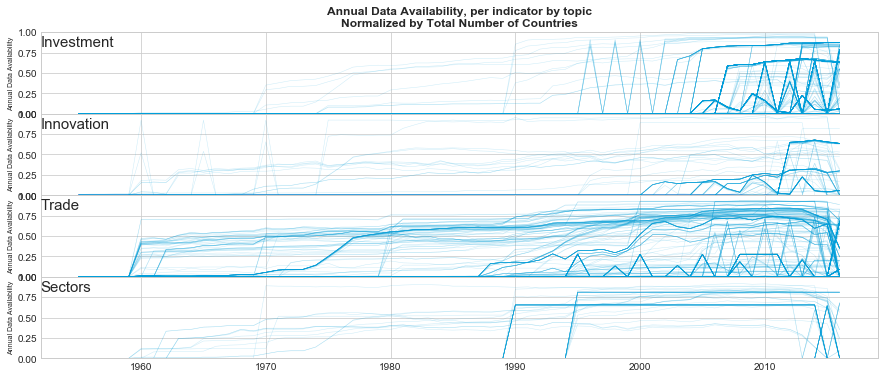

In [139]:
plot_bytopic(kind="topic", level="indicator")

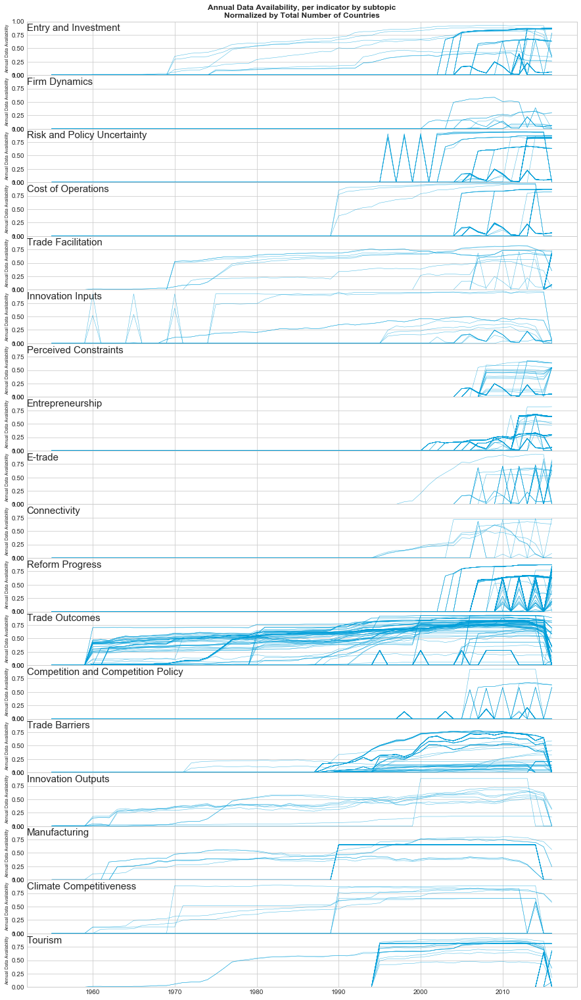

In [142]:
plot_bytopic(kind="subtopic", level="indicator", alpha=0.75)

Investment


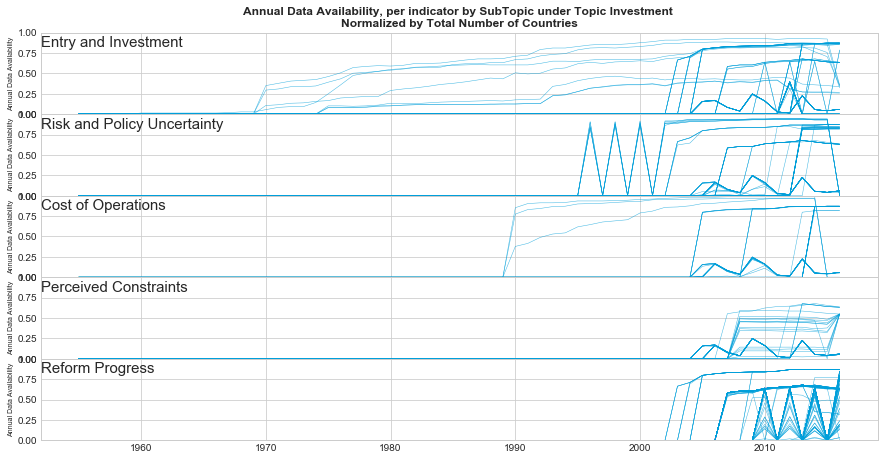

Innovation


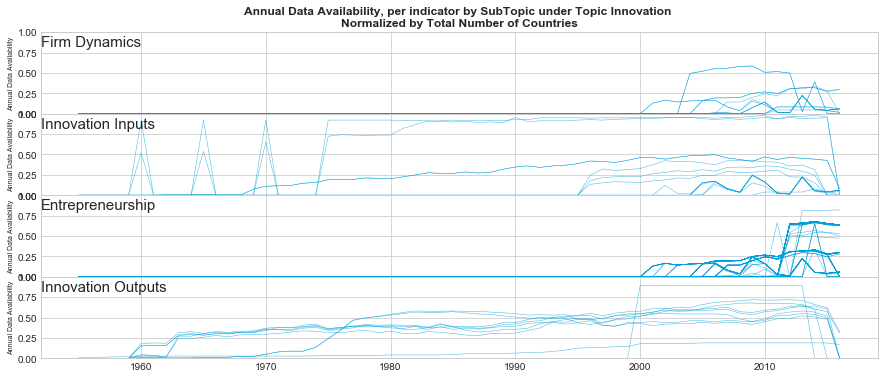

Trade


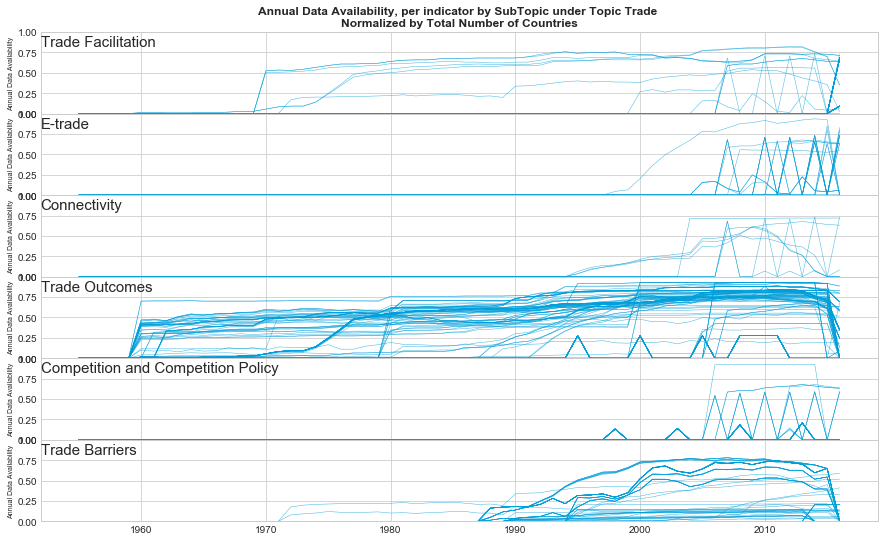

Sectors


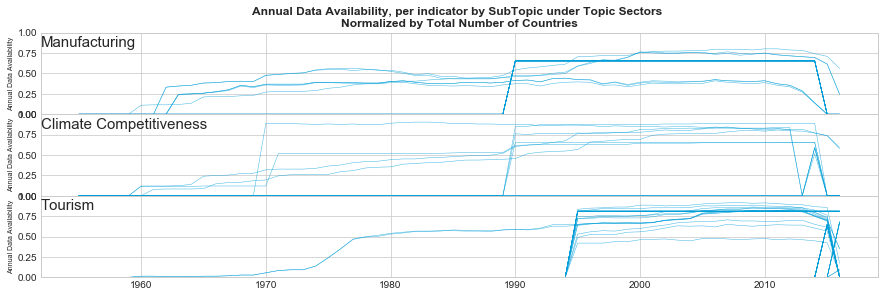

In [171]:
plot_bysubtopic(level="indicator", alpha=0.75)

## By Dataset

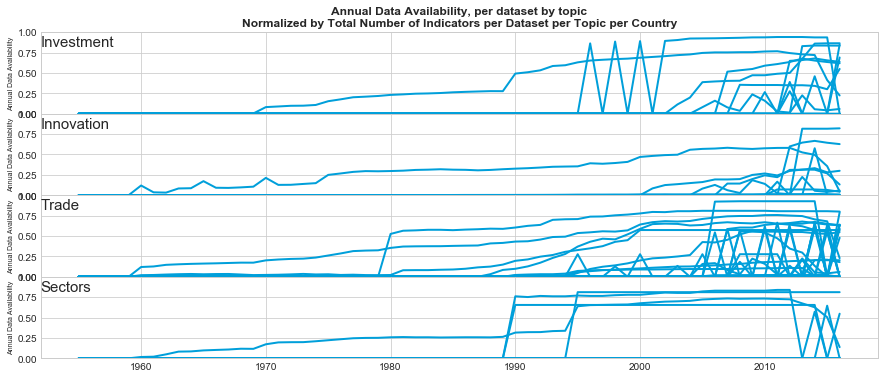

In [155]:
plot_bytopic(kind="topic", level="dataset", lw=2, alpha=1)

In [ ]:
def plot_bytopic_datasetverbose(kind="topic", lw=0.5, alpha=0.2, max_ylim=1):
    if kind == "topic":
        handle = 'topiclvl1'
    elif kind == "subtopic":
        handle = 'topiclvl2'
        
    topic_list = df_merged2[handle].unique()
    
    f, axarr = plt.subplots(len(topic_list), sharex=True, sharey=True, figsize=(15,len(topic_list)*1.5))
    
    count = 0
    for topic in topic_list:
        norm = "Total Number of Indicators per Dataset per Topic per Country"
        normalizer = df_merged2[df_merged2[handle] == topic].groupby('dataset_id')['indicatorId'].apply(lambda x: len(x.unique()))*len(df_merged2['Country ISO3'].unique())
        df_temp = (df_merged2[df_merged2[handle] == topic].groupby('dataset_id')[list_timeframe_all].sum().T/normalizer).T
            
        axarr[count].plot(df_temp[list_timeframe_all].T, color='#009fda', lw=lw, alpha=alpha)
        axarr[count].set_ylabel("Annual Data Availability", fontsize=7)
        axarr[count].set_ylim(0,max_ylim)
        if count == 0:
            axarr[0].set_title("Annual Data Availability, per %s by %s\nNormalized by %s" % (level, kind, norm), fontweight="bold")
        axarr[count].set_title("%s" % topic, loc='left', y=0.75,fontsize=15)
        count += 1

    f.subplots_adjust(hspace=0)
    plt.legend()
    plt.show()

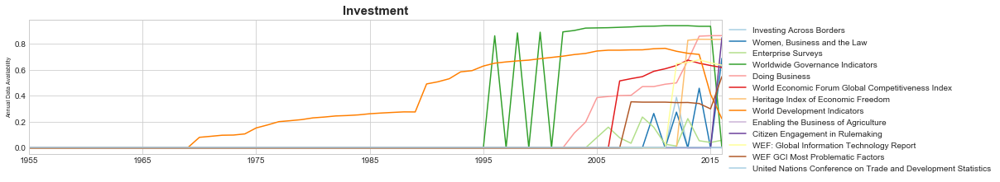

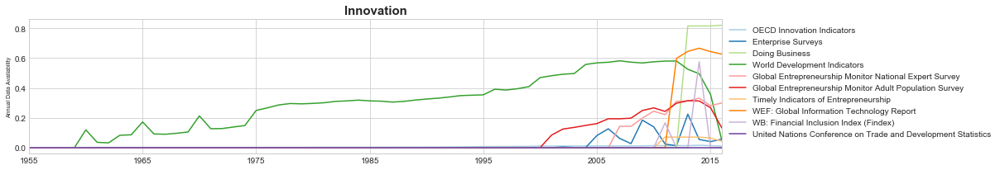

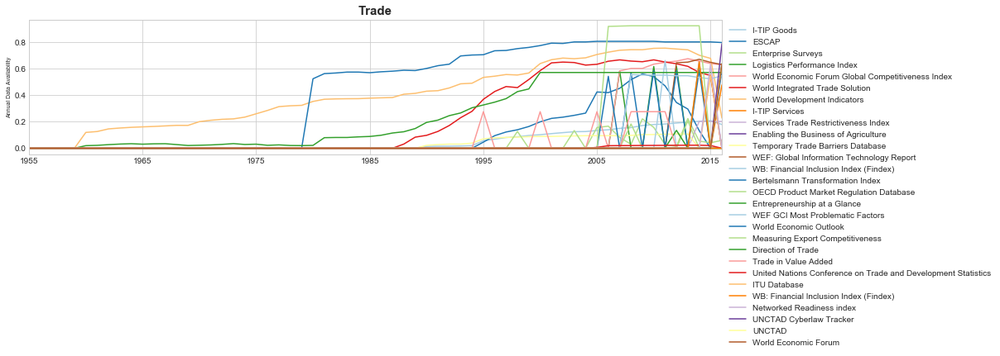

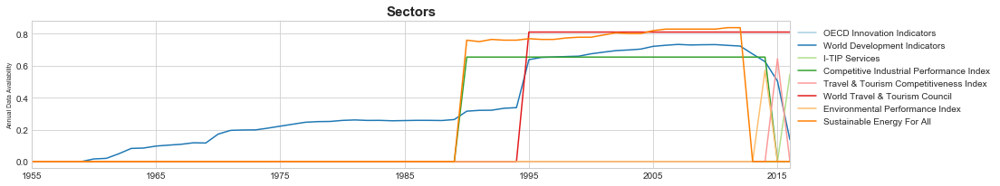

In [203]:
handle='topiclvl1'
level="topic"
topic_list = df_merged2[handle].unique()

sns.set_palette(sns.color_palette("Paired", 16))

for topic in topic_list:
    norm = "Total Number of Indicators per Dataset per Topic per Country"
    normalizer = df_merged2[df_merged2[handle] == topic].groupby('dataset_id')['indicatorId'].apply(lambda x: len(x.unique()))*len(df_merged2['Country ISO3'].unique())
    df_temp = (df_merged2[df_merged2[handle] == topic].groupby('dataset_id')[list_timeframe_all].sum().T/normalizer).T
    df_temp = df_temp.join(df_tc_datasets[['title', 'id']].set_index('id'), how='left').set_index('title')
    
    df_temp[list_timeframe_all].T.plot(figsize=(15,3))
    plt.ylabel("Annual Data Availability", fontsize=7)
    plt.title("%s" % topic, fontweight="bold",fontsize=15)
    plt.legend(loc="best", bbox_to_anchor=(1,1))
    plt.show()

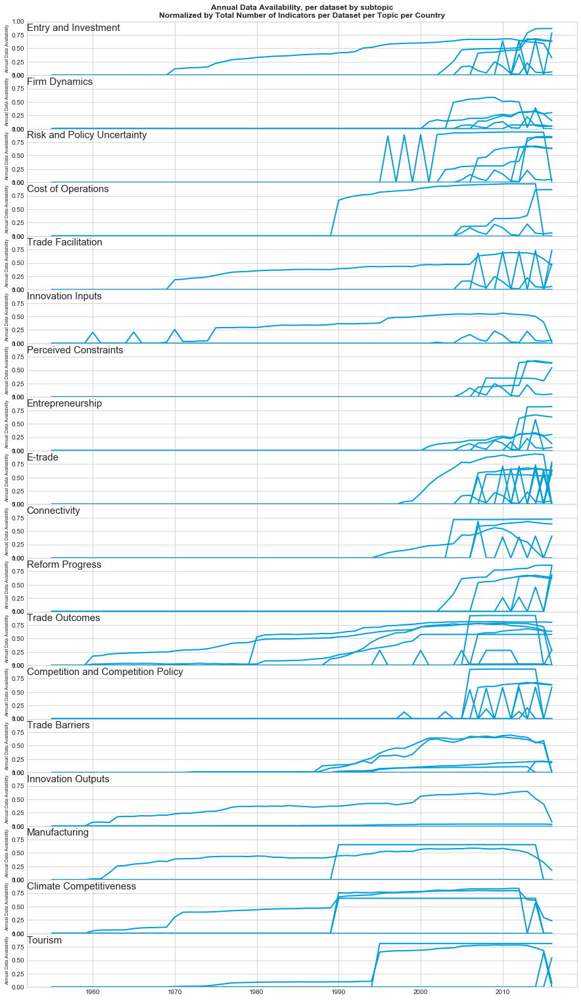

In [156]:
plot_bytopic(kind="subtopic", level="dataset", lw=2, alpha=1)

Investment


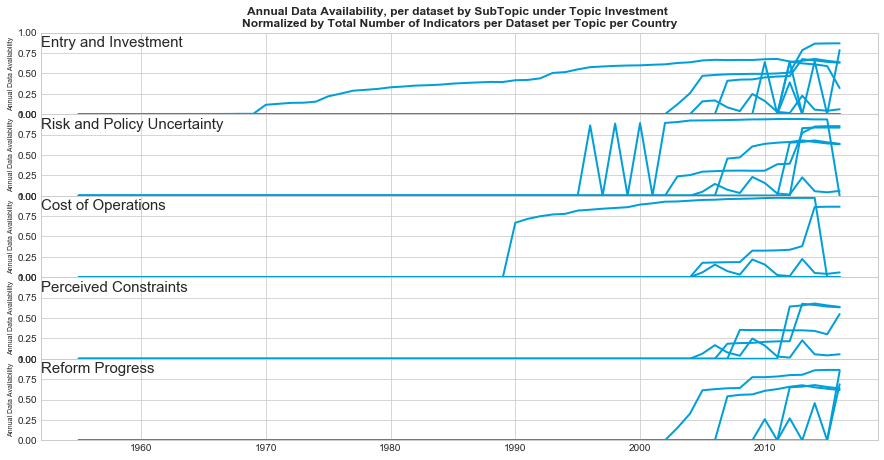

Innovation


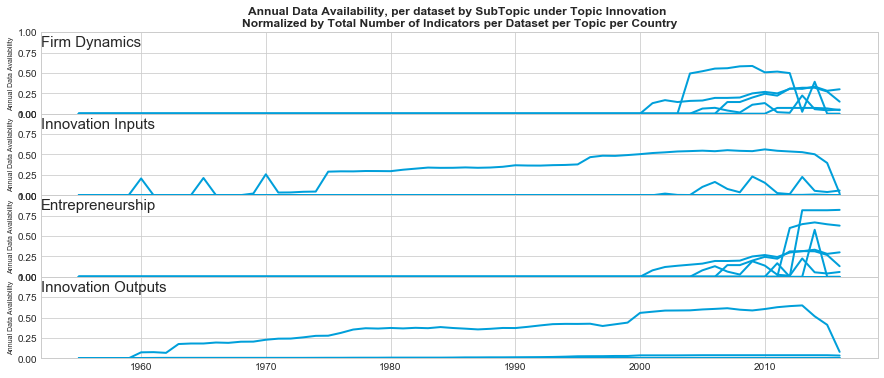

Trade


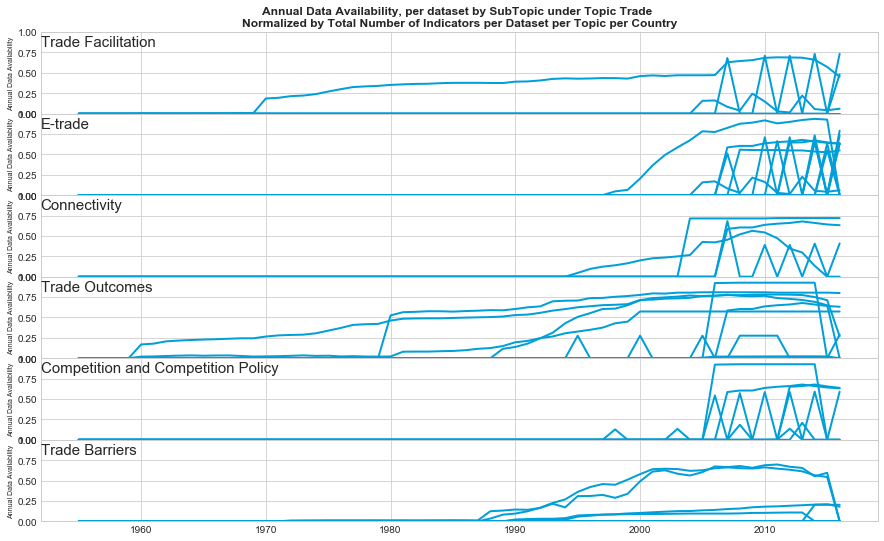

Sectors


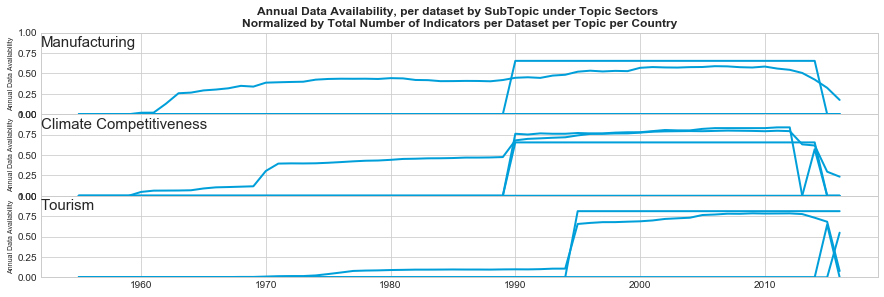

In [173]:
plot_bysubtopic(level="dataset", lw=2, alpha=1)

Investment


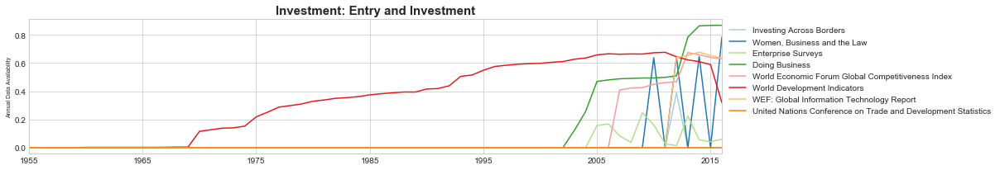

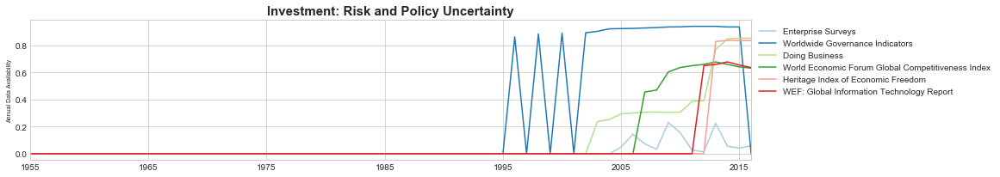

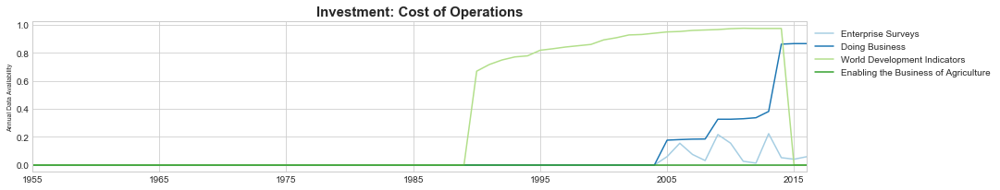

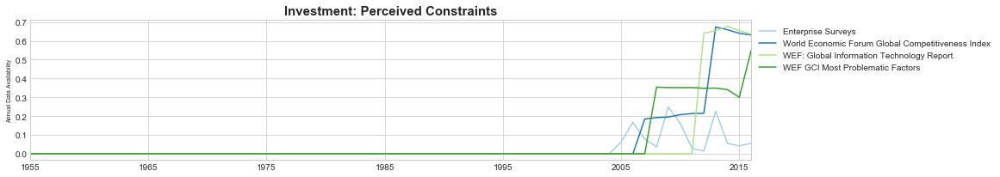

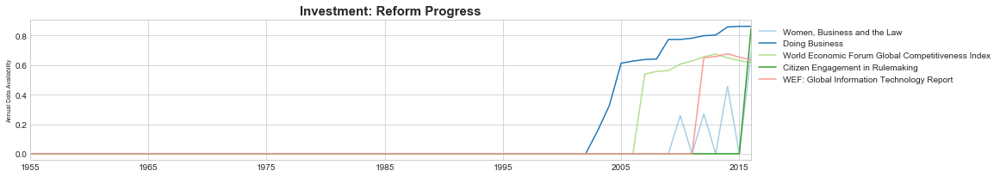

Innovation


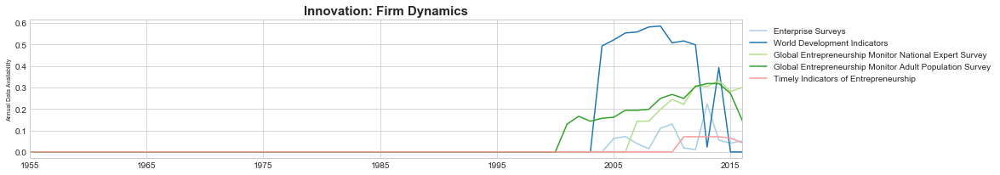

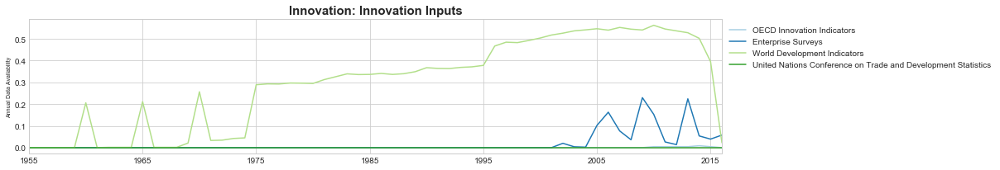

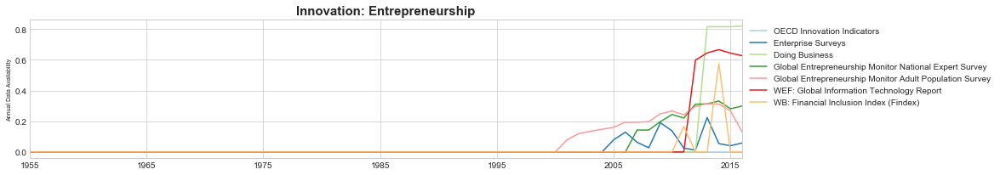

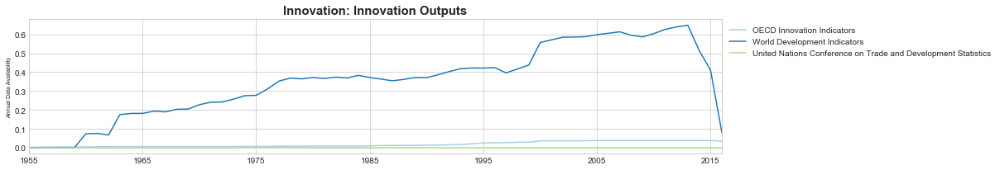

Trade


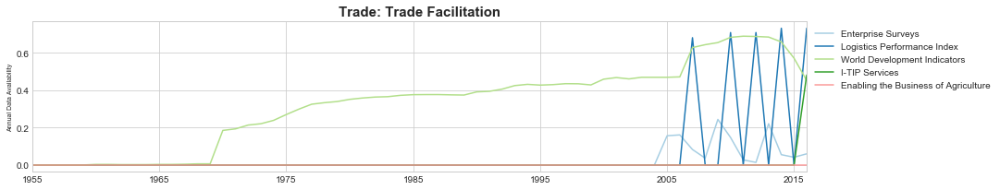

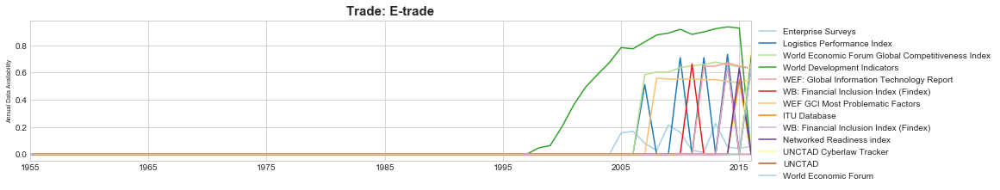

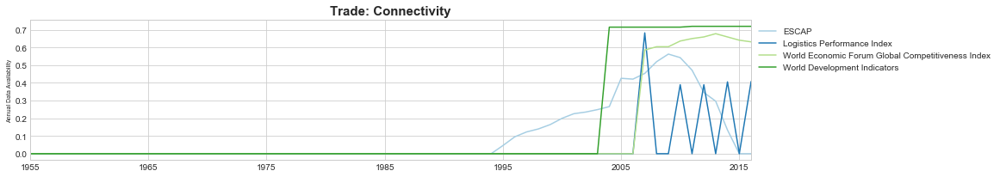

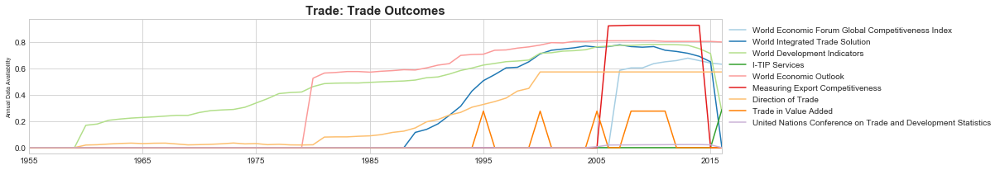

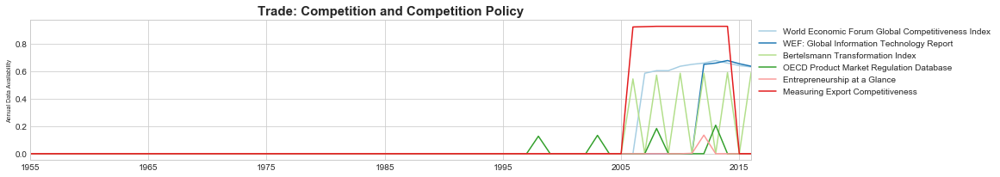

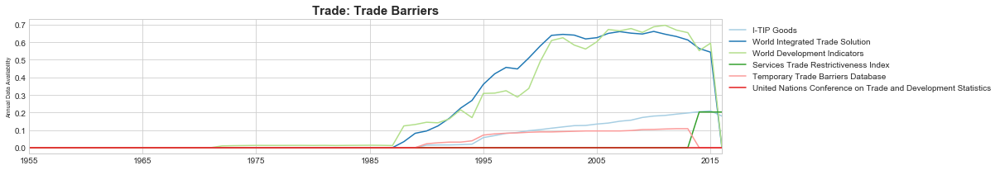

Sectors


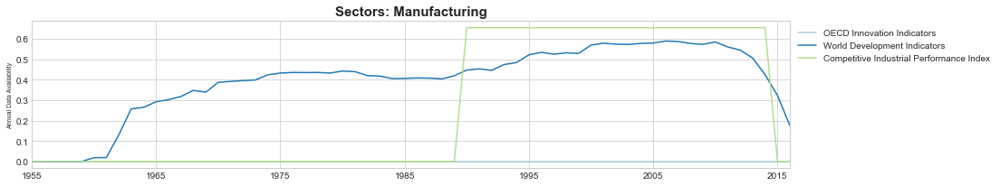

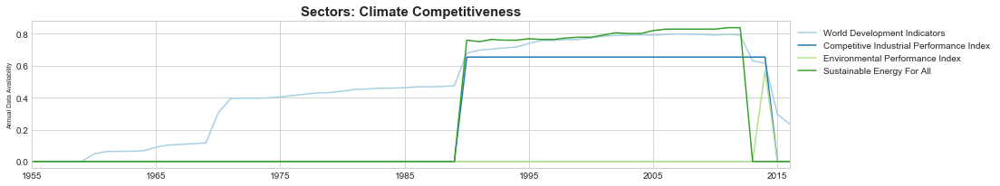

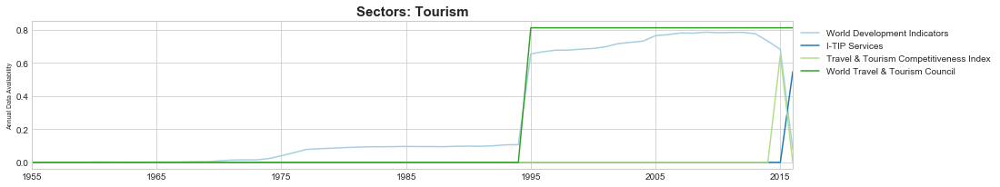

In [204]:
handle='topiclvl2'
level="topic"
topics = df_merged2['topiclvl1'].unique()
sns.set_palette(sns.color_palette("Paired", 16))

for top in topics:
    topic_list = df_merged2[df_merged2['topiclvl1'] == top][handle].unique()
    print(top)
    for topic in topic_list:
        norm = "Total Number of Indicators per Dataset per Subtopic per Country"
        normalizer = df_merged2[df_merged2[handle] == topic].groupby('dataset_id')['indicatorId'].apply(lambda x: len(x.unique()))*len(df_merged2['Country ISO3'].unique())
        df_temp = (df_merged2[df_merged2[handle] == topic].groupby('dataset_id')[list_timeframe_all].sum().T/normalizer).T
        df_temp = df_temp.join(df_tc_datasets[['title', 'id']].set_index('id'), how='left').set_index('title')

        df_temp[list_timeframe_all].T.plot(figsize=(15,3))
        plt.ylabel("Annual Data Availability", fontsize=7)
        plt.title("%s: %s" % (top, topic), fontweight="bold",fontsize=15)
        plt.legend(loc="best", bbox_to_anchor=(1,1))
        plt.show()

## By Country

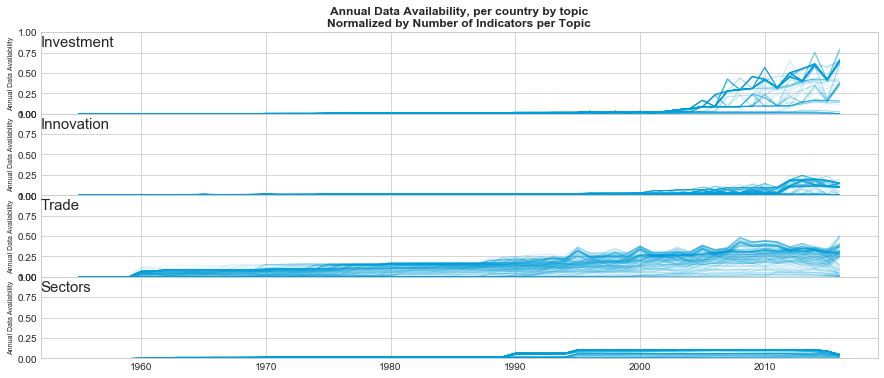

In [134]:
plot_bytopic(kind="topic", level="country")

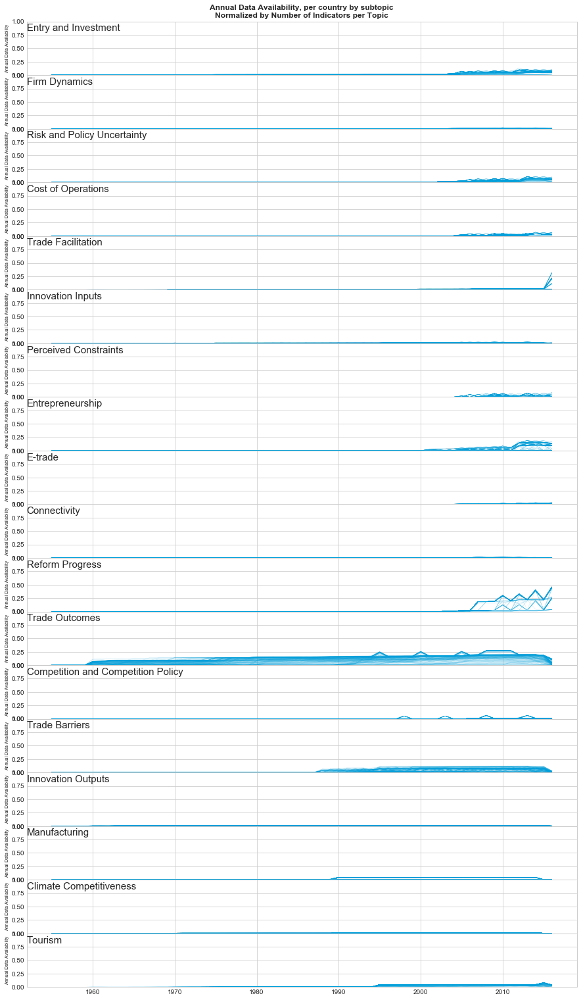

In [138]:
plot_bytopic(kind="subtopic", level="country")

Investment


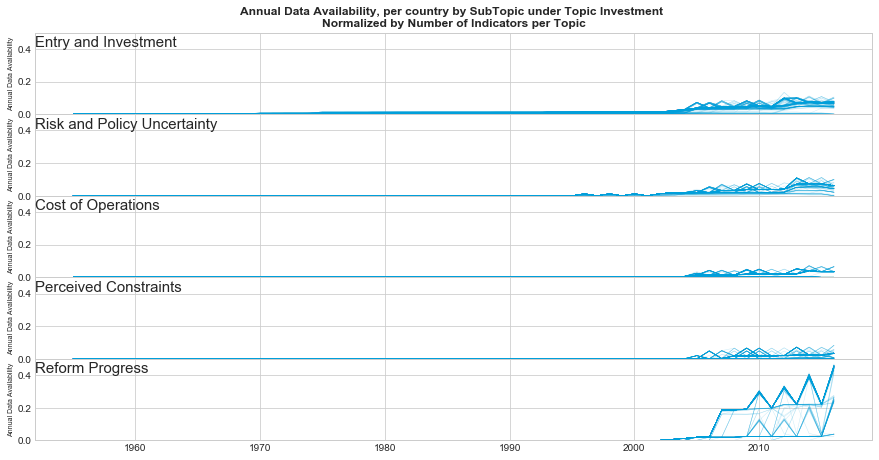

Innovation


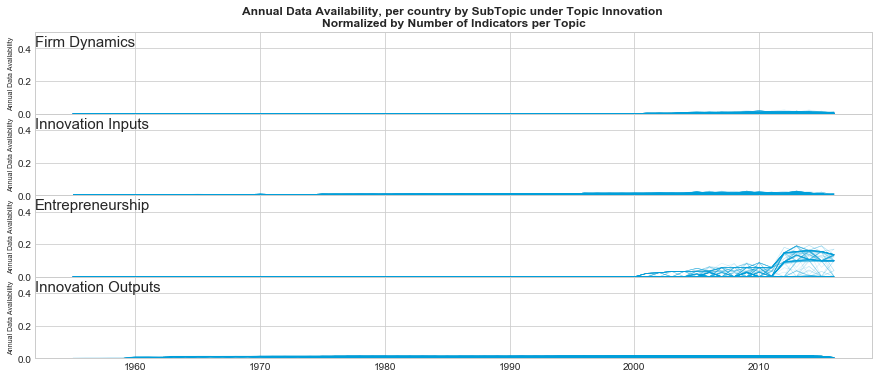

Trade


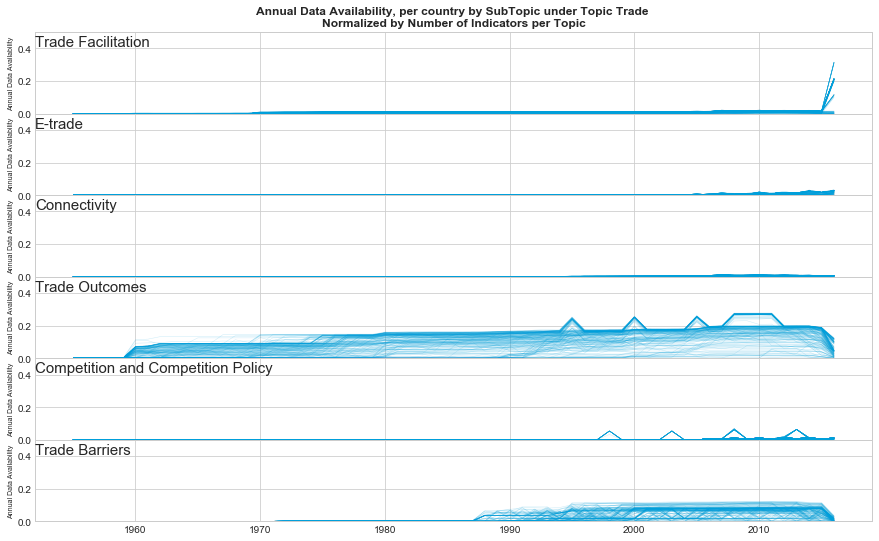

Sectors


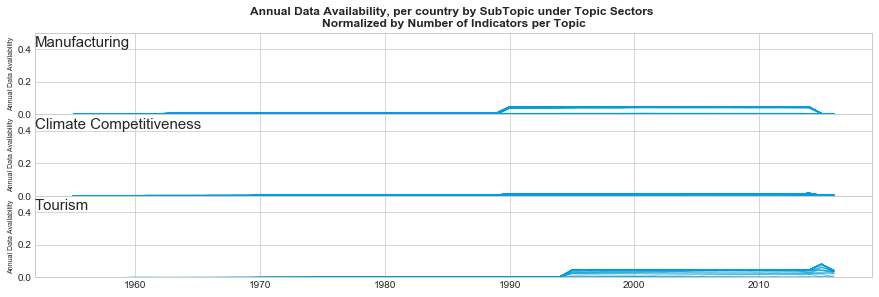

In [175]:
plot_bysubtopic(level="country", max_ylim=0.5)

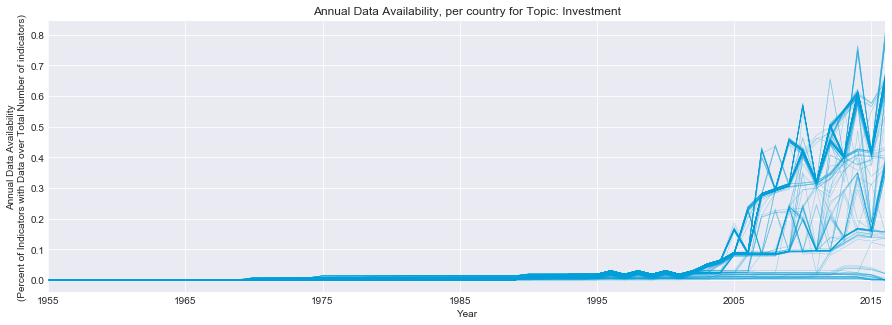

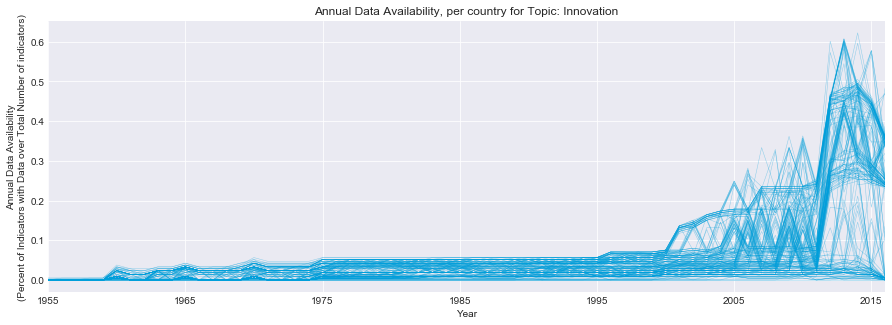

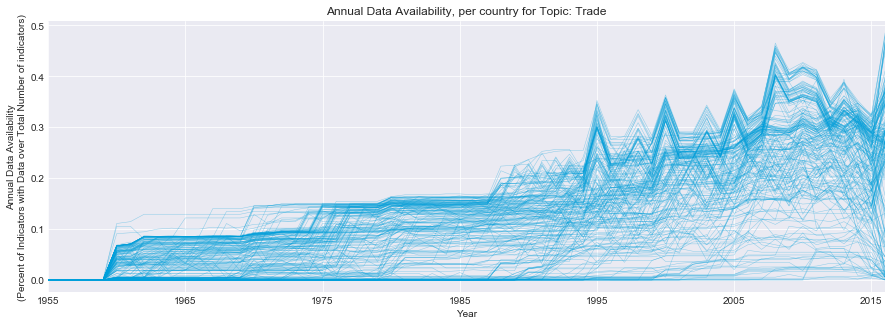

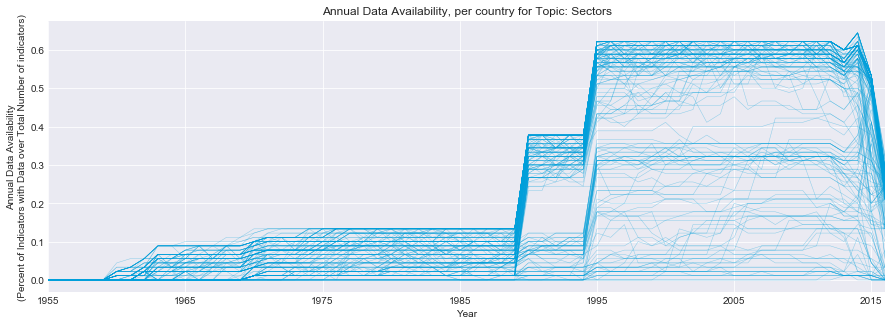

In [152]:
# topic = topic_list[0]
for topic in topic_list:
    indicators_per_topic = len(df_merged2[df_merged2['topiclvl1'] == topic]['indicatorId'].unique())
    by_country_topic = df_merged2[df_merged2['topiclvl1'] == topic].groupby('Country ISO3')[list_timeframe_all].sum()/indicators_per_topic
    by_country_topic[list_timeframe_all].T.plot(color='#009fda', lw=0.5, alpha=0.4, figsize=(15,5))
    plt.title("Annual Data Availability, per country for Topic: %s" % topic)
    plt.ylabel("Annual Data Availability\n(Percent of Indicators with Data over Total Number of indicators)")
    plt.xlabel("Year")
    plt.legend([])
    plt.show()

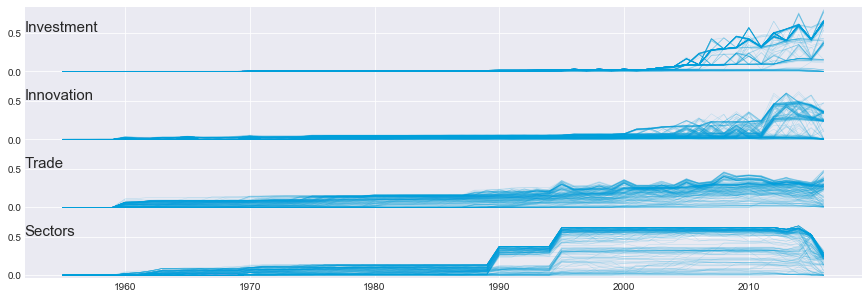

In [154]:
# f, axarr = plt.subplots(len(topic_list), sharex=True, sharey=True, figsize=(15,5))

# count = 0
# for topic in topic_list:
#     indicators_per_topic = len(df_merged2[df_merged2['topiclvl1'] == topic]['indicatorId'].unique())
#     by_country_topic = df_merged2[df_merged2['topiclvl1'] == topic].groupby('Country ISO3')[list_timeframe_all].sum()/indicators_per_topic
#     axarr[count].plot(by_country_topic[list_timeframe_all].T, color='#009fda', lw=0.5, alpha=0.2)
#     axarr[count].set_title("%s" % topic, loc='left', y=0.55,fontsize=15)
#     count += 1

# f.subplots_adjust(hspace=0)
# plt.legend([])
# # plt.setp([a.get_xticklabels() for a in f.axes[:-1]], visible=False)
# plt.show()

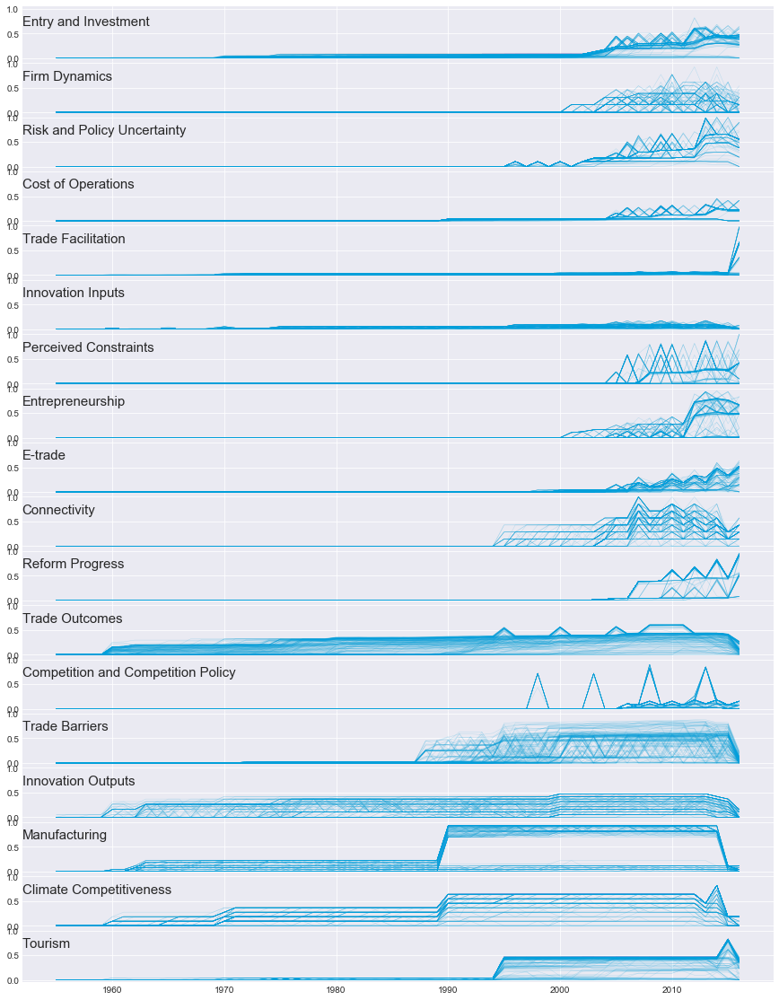

In [211]:
# f, axarr = plt.subplots(len(subtopic_list), sharex=True, sharey=True, figsize=(15,20))

# count = 0
# for topic in subtopic_list:
#     indicators_per_topic = len(df_merged2[df_merged2['topiclvl2'] == topic]['indicatorId'].unique())
#     by_country_topic = df_merged2[df_merged2['topiclvl2'] == topic].groupby('Country ISO3')[list_timeframe_all].sum()/indicators_per_topic
#     axarr[count].plot(by_country_topic[list_timeframe_all].T, color='#009fda', lw=0.5, alpha=0.2)
#     axarr[count].set_title("%s" % topic, loc='left', y=0.55,fontsize=15)
#     count += 1

# f.subplots_adjust(hspace=0)
# plt.legend([])
# # plt.setp([a.get_xticklabels() for a in f.axes[:-1]], visible=False)
# plt.show()

# Dataset-level EDA

In [5]:
df_merged2 = pd.read_csv("2017-08-31-TCdataset-narrowtopics.csv")
nondate_cols_all = ['Country ISO3','dataset_id','indicatorId', 'topiclvl1', 'topiclvl2']
list_timeframe_all = [col for col in df_merged2.columns if col not in nondate_cols_all]

In [6]:
df_merged2.head()

,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,...,2012,2013,2014,2015,2016,Country ISO3,dataset_id,indicatorId,topiclvl1,topiclvl2
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,228.0,Investment,Entry and Investment
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,276.0,Innovation,Firm Dynamics
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,277.0,Innovation,Firm Dynamics
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,280.0,Investment,Risk and Policy Uncertainty
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,AFG,49,279.0,Investment,Risk and Policy Uncertainty


In [7]:
tc_datasets = 'http://tcdata360-backend.worldbank.org/api/v1/datasets'
df_tc_datasets = pd.read_json(requests.get(tc_datasets).text)

In [8]:
df_tc_datasets.head()

,description,id,legal,link,slug,source,title
0,NaN,913,"For use guidelines, please consult AfroBaromet...",http://www.afrobarometer.org/data/merged-data,AFRO,AfroBarometer,AfroBarometer
1,NaN,147,"For use guidelines, please consult Govdata360 ...",https://govdata360.worldbank.org/,PIM,Govdata360 - Public Investment Management,Public Investment Management
2,NaN,483,"For use guidelines, please consult Govdata360 ...",https://govdata360.worldbank.org/,HRM,Govdata360 - Human Resource Management,Human Resource Management
3,NaN,747,"For use guidelines, please consult World Bank ...",https://data.worldbank.org/data-catalog/ed-stats,WBG-genderstats,WBG - Gender Statistics,Gender Statistics
4,NaN,53,"For use guidelines, please consult World Econo...",http://reports.weforum.org/global-competitiven...,global_competitiveness_index,World Economic Forum Global Competitiveness Index,World Economic Forum Global Competitiveness Index


In [9]:
total_indicators_per_dataset = df_merged2.groupby(['dataset_id'])['indicatorId'].apply(lambda x: len(x.unique()))
total_indicators_per_dataset

dataset_id
44      15
45       3
46      19
47      23
48     132
49     112
50       7
51       6
52      65
53     119
54      11
55      15
56     176
57     168
58      12
59      20
60       3
61       6
62      46
63       7
64      10
65      67
66       6
67       3
68      29
70       3
71      15
72       2
73       5
74       3
75      40
76     157
77      20
78      19
79      12
80       4
81       1
508      3
509      2
511      2
512      4
513      1
514      1
Name: indicatorId, dtype: int64

## Coverage

In [10]:
dataset_name = df_tc_datasets[['id','title']].set_index('id')

In [11]:
country_presence = pd.DataFrame(df_merged2.groupby(['dataset_id', 'Country ISO3'])[list_timeframe_all].sum().sum(axis=1)).unstack(level=-1).notnull().sum(axis=1)

In [12]:
country_presence_df = pd.DataFrame(country_presence).join(dataset_name).sort_values(by='title').drop([509], axis=0).set_index('title')

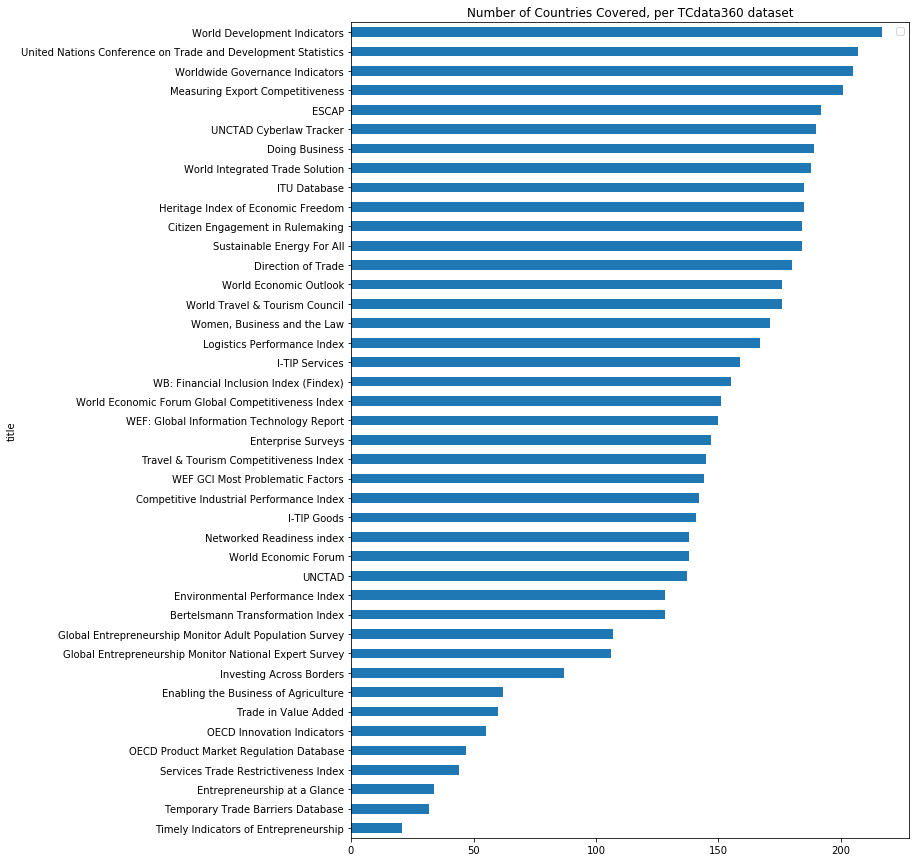

In [13]:
country_presence_df.sort_values(by=0, ascending=True).plot(kind='barh', figsize=(10,15))
plt.legend("")
plt.title("Number of Countries Covered, per TCdata360 dataset")

In [14]:
by_dataset = (df_merged2.groupby(['dataset_id', 'Country ISO3'])[list_timeframe_all].sum().unstack(level=0).fillna(0).mean().unstack(level=-1)/total_indicators_per_dataset).T

In [15]:
by_dataset.head()

,1955,1956,1957,1958,1959,1960,1961,1962,1963,1964,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
dataset_id,,,,,,,,,,,,,,,,,,,,,
44,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.150230,0.156375,0.171736,0.179724,0.183410,0.190783,0.197235,0.204301,0.209217,0.179724
45,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.453149,0.519201,0.562212,0.542243,0.471582,0.345622,0.296467,0.133641,0.000000,0.000000
46,0.000485,0.000728,0.000728,0.00097,0.00097,0.00097,0.001213,0.001455,0.001455,0.001455,...,0.009944,0.009944,0.009944,0.012006,0.012006,0.012006,0.012006,0.014067,0.011945,0.008853
47,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.389100,0.000000,0.000000,0.000000,0.000000
48,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.264383,0.000000,0.274787,0.000000,0.458595,0.000000,0.688870


In [16]:
check_dataset_dup = pd.DataFrame(total_indicators_per_dataset).join(dataset_name).sort_values(by='title')

In [17]:
check_dataset_dup

,indicatorId,title
dataset_id,,
67,3,Bertelsmann Transformation Index
63,7,Citizen Engagement in Rulemaking
77,20,Competitive Industrial Performance Index
74,3,Direction of Trade
52,65,Doing Business
45,3,ESCAP
62,46,Enabling the Business of Agriculture
49,112,Enterprise Surveys
70,3,Entrepreneurship at a Glance


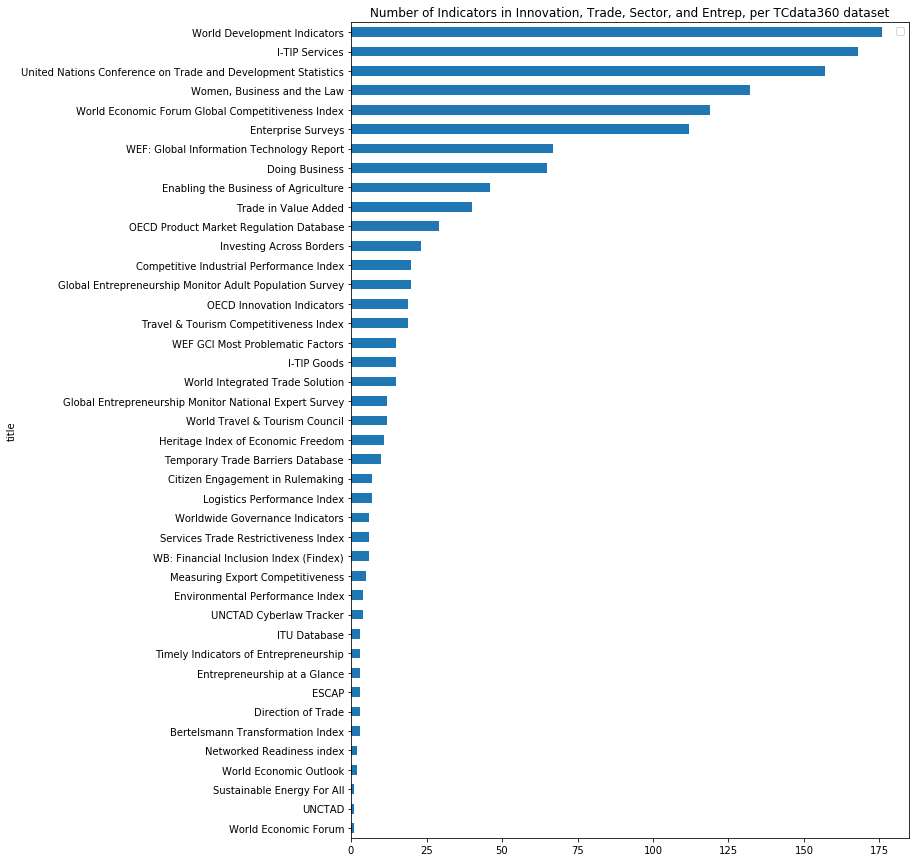

In [18]:
check_dataset_dup.drop([509], axis=0).sort_values(by='indicatorId', ascending=True).set_index('title').plot(kind='barh', figsize=(10,15))
plt.legend("")
plt.title("Number of Indicators in Innovation, Trade, Sector, and Entrep, per TCdata360 dataset")

In [19]:
check_dataset_dup[check_dataset_dup['title'].duplicated(keep=False)]

,indicatorId,title
dataset_id,,
509,2,WB: Financial Inclusion Index (Findex)
66,6,WB: Financial Inclusion Index (Findex)


We drop dataset_id == 509 in by_dataset to avoid duplicate sources. (509 comes from Govdata360)

In [20]:
by_dataset = by_dataset.drop([509], axis=0)

In [21]:
by_dataset = by_dataset.join(dataset_name).set_index('title')

In [22]:
by_dataset.index.is_unique

True

In [23]:
dataset_coverage = check_dataset_dup.drop([509], axis=0).set_index('title').join(country_presence_df)

In [24]:
dataset_coverage.columns = ['number_of_indicators', 'number_of_countries']

In [25]:
check_dataset_dup.head()

,indicatorId,title
dataset_id,,
67,3,Bertelsmann Transformation Index
63,7,Citizen Engagement in Rulemaking
77,20,Competitive Industrial Performance Index
74,3,Direction of Trade
52,65,Doing Business


In [26]:
df_dataset_topic = df_merged2[['dataset_id', 'topiclvl2', 'indicatorId']].drop_duplicates().groupby(['dataset_id', 'topiclvl2']).size().unstack(level=-1).join(check_dataset_dup[['title']]).set_index('title')

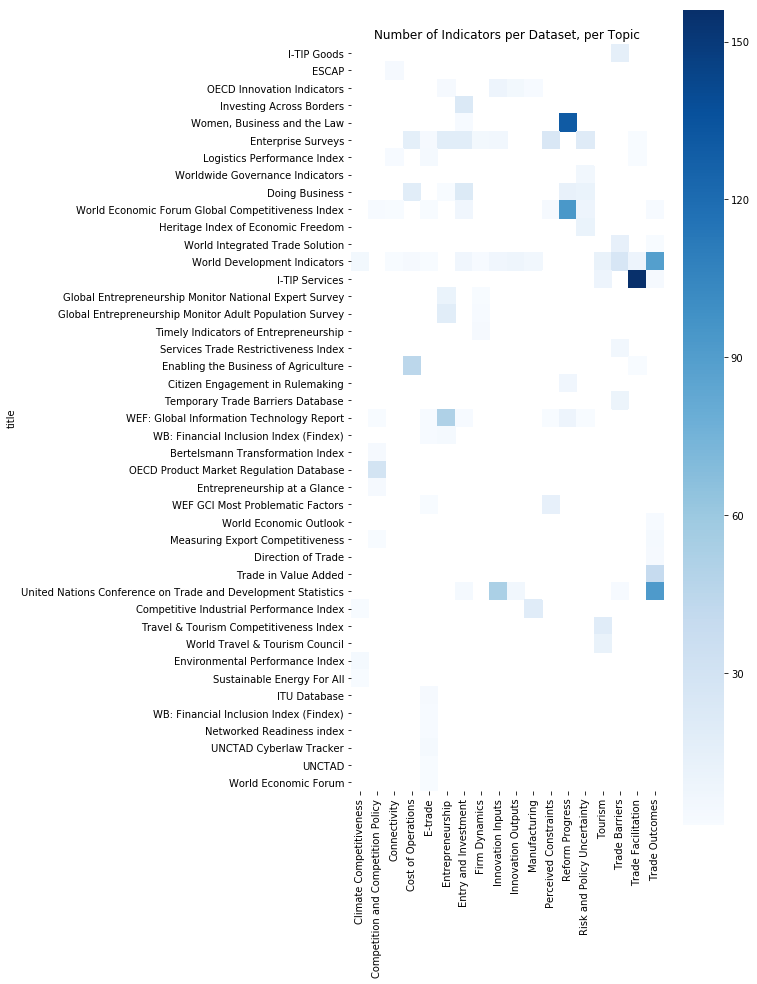

In [27]:
plt.figure(figsize=(7,15))
sns.heatmap(df_dataset_topic, cmap='Blues', square=True)
plt.title("Number of Indicators per Dataset, per Topic")

In [28]:
df_dataset_topic_perc = (df_dataset_topic.T/df_dataset_topic.sum(axis=1))

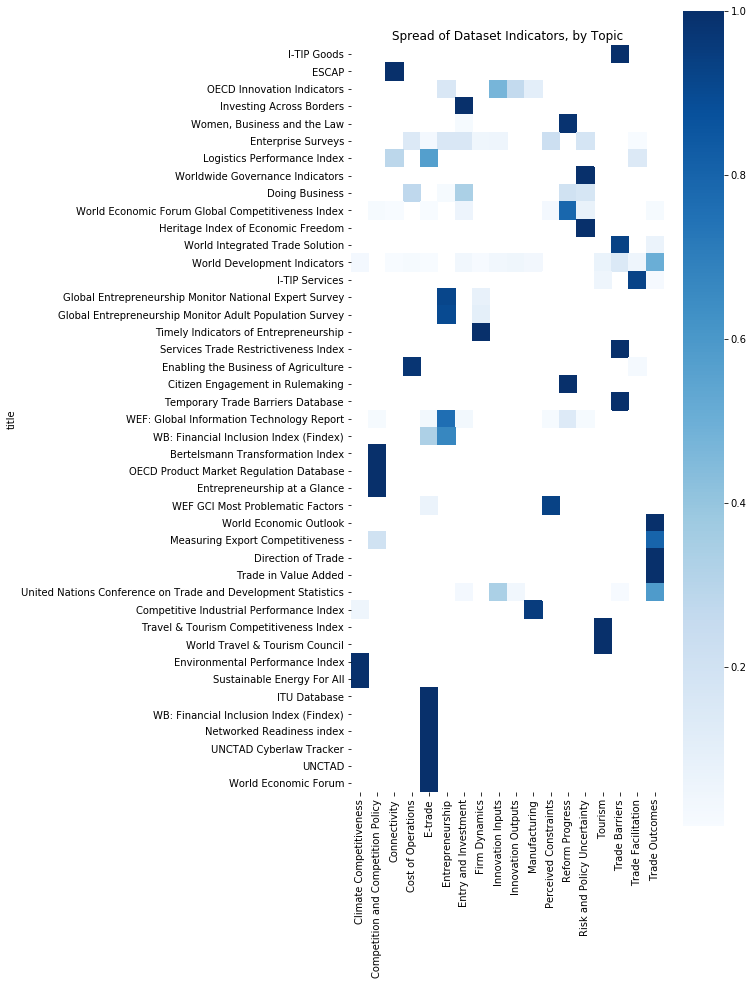

In [29]:
plt.figure(figsize=(7,15))
sns.heatmap(df_dataset_topic_perc.T, cmap='Blues', square=True)
plt.title("Spread of Dataset Indicators, by Topic")

In [30]:
df_dataset_topic_hhi = (df_dataset_topic_perc.fillna(0) ** 2).sum().sort_values()

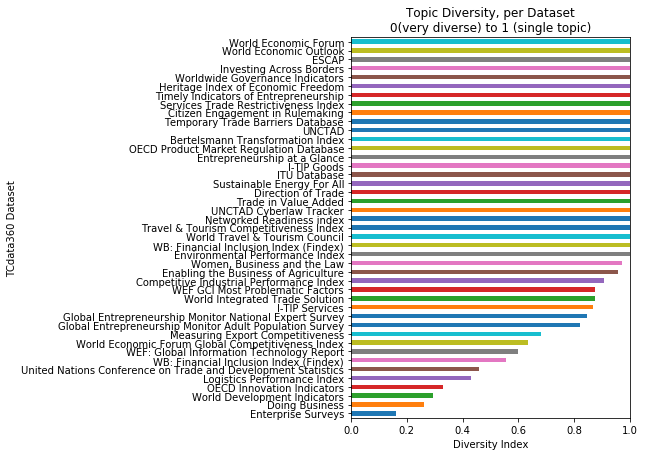

In [31]:
df_dataset_topic_hhi.plot(kind="barh", figsize=(5,7))
plt.ylabel("TCdata360 Dataset")
plt.xlabel("Diversity Index")
plt.xlim(0,1)
plt.title("Topic Diversity, per Dataset\n0(very diverse) to 1 (single topic)")

In [32]:
number_of_subtopics = df_merged2.groupby('dataset_id')['topiclvl2'].apply(lambda x: len(x.unique()))

In [33]:
dataset_coverage = dataset_coverage.join(pd.DataFrame(number_of_subtopics).join(check_dataset_dup['title'], how='left').set_index("title"))

In [34]:
dataset_coverage.columns = ['number_of_indicators', 'number_of_countries', 'number_of_subtopics']

In [35]:
dataset_coverage.to_csv("data/3.1-dataset-bubbleplot.csv")

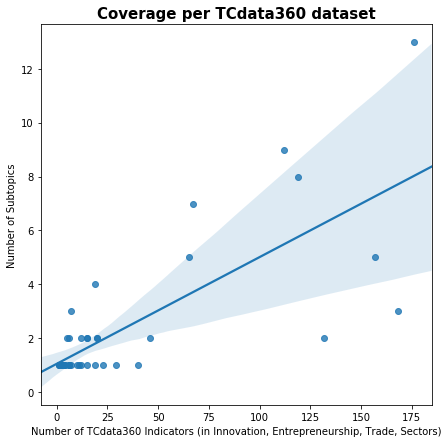

In [36]:
plt.figure(figsize=(7,7))
ax = sns.regplot(x="number_of_indicators", y="number_of_subtopics", data=dataset_coverage)

plt.title("Coverage per TCdata360 dataset", fontsize=15, fontweight="bold")
plt.xlabel("Number of TCdata360 Indicators (in Innovation, Entrepreneurship, Trade, Sectors)")
plt.ylabel("Number of Subtopics")

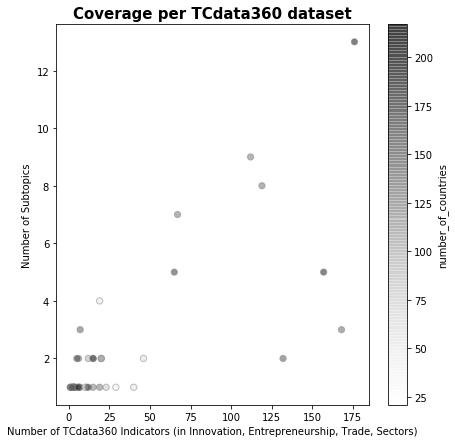

In [37]:
fig, ax = plt.subplots(figsize=(10,10))
dataset_coverage.plot(kind='scatter',x='number_of_indicators', c='number_of_countries',
                      y='number_of_subtopics', figsize=(7,7),lw=1,s=40,alpha=0.5, edgecolor='gray', ax=ax)
ax.set_title("Coverage per TCdata360 dataset")
ax.set_title("Coverage per TCdata360 dataset", fontsize=15, fontweight="bold")
ax.set_xlabel("Number of TCdata360 Indicators (in Innovation, Entrepreneurship, Trade, Sectors)")
ax.set_ylabel("Number of Subtopics")

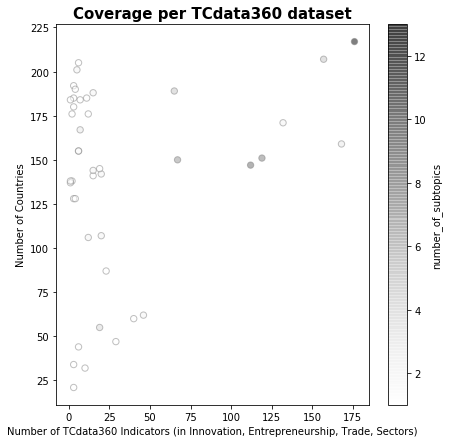

In [38]:
fig, ax = plt.subplots(figsize=(10,10))
dataset_coverage.plot(kind='scatter',x='number_of_indicators', y='number_of_countries',
                      c='number_of_subtopics', figsize=(7,7),lw=1,s=40,alpha=0.5, edgecolor='gray', ax=ax)
ax.set_title("Coverage per TCdata360 dataset")
ax.set_title("Coverage per TCdata360 dataset", fontsize=15, fontweight="bold")
ax.set_xlabel("Number of TCdata360 Indicators (in Innovation, Entrepreneurship, Trade, Sectors)")
ax.set_ylabel("Number of Countries")

# for ix, txt in enumerate(dataset_coverage.index):
#     ax.annotate(txt, (dataset_coverage['number_of_indicators'][ix]+3, dataset_coverage['number_of_countries'][ix]-1.5), wrap=True)

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\categorical.py:462: FutureWarning:

remove_na is deprecated and is a private function. Do not use.



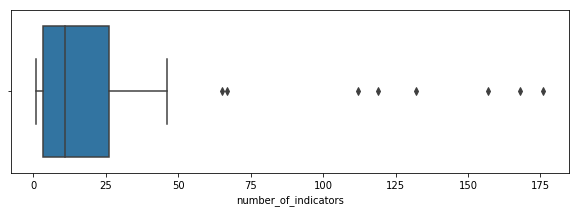

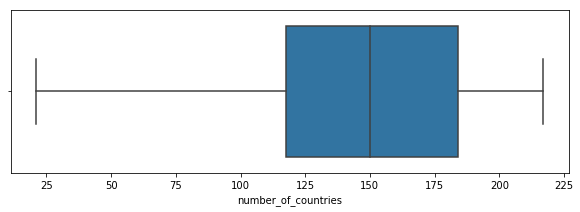

In [39]:
for col in dataset_coverage.columns[:2]:
    plt.figure(figsize=(10,3))
    sns.boxplot(x=dataset_coverage[col])
    plt.show()

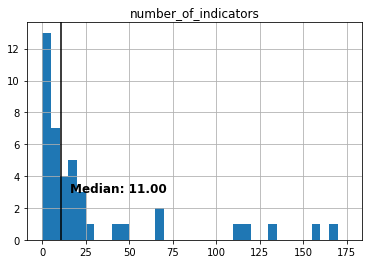

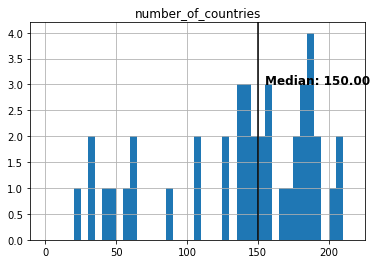

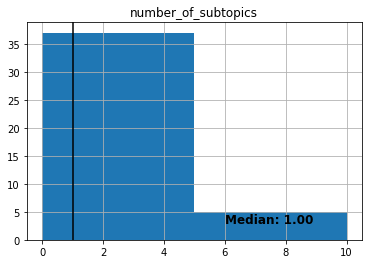

In [40]:
for col in dataset_coverage.columns:
    dataset_coverage[col].hist(bins=np.arange(0,max(dataset_coverage[col]),5))
    plt.axvline(dataset_coverage[col].median(), color='black')
    plt.text(dataset_coverage[col].median()+5, 3, "Median: %0.2f" % dataset_coverage[col].median(), fontsize=12, fontweight="bold")
    plt.title(col)
    plt.show()

IndexError: 0

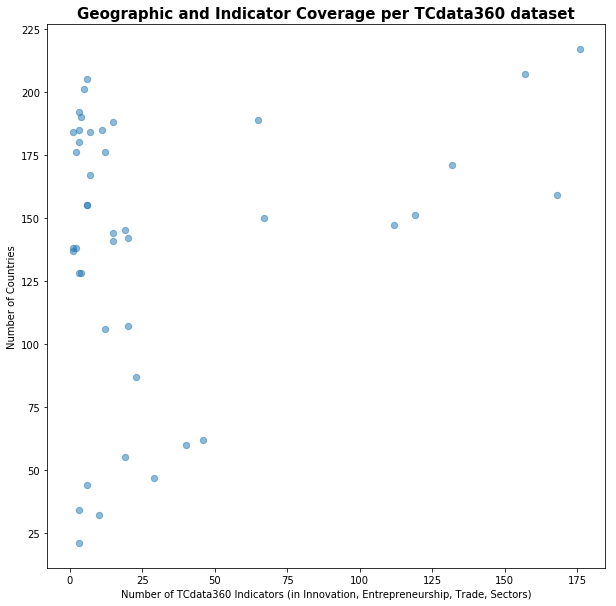

In [41]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(dataset_coverage['number_of_indicators'], dataset_coverage['number_of_countries'], s=40, alpha=0.5)
plt.title("Geographic and Indicator Coverage per TCdata360 dataset", fontsize=15, fontweight="bold")
plt.xlabel("Number of TCdata360 Indicators (in Innovation, Entrepreneurship, Trade, Sectors)")
plt.ylabel("Number of Countries")

for ix, txt in enumerate(dataset_coverage.index):
    ax.annotate(txt, (dataset_coverage['number_of_indicators'][ix]+3, dataset_coverage['number_of_countries'][ix]-1.5), wrap=True)

In [42]:
dataset_coverage['number_of_indicators'].median(), dataset_coverage['number_of_countries'].median()

(11.0, 150.0)

IndexError: 0

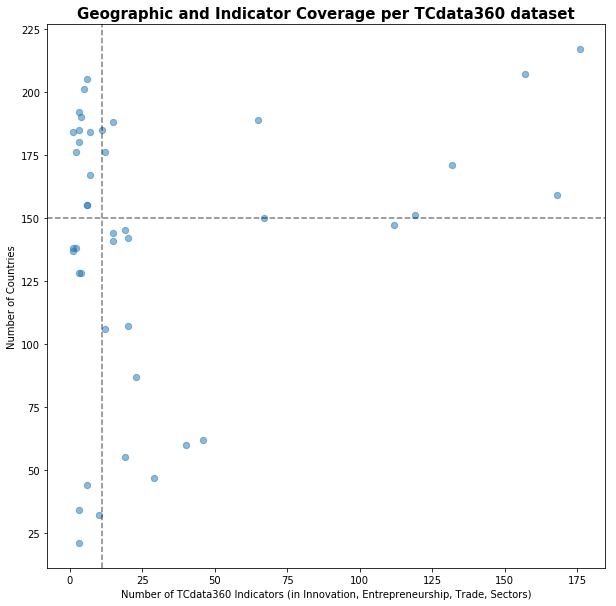

In [43]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(dataset_coverage['number_of_indicators'], dataset_coverage['number_of_countries'], s=40, alpha=0.5)
plt.title("Geographic and Indicator Coverage per TCdata360 dataset", fontsize=15, fontweight="bold")
plt.xlabel("Number of TCdata360 Indicators (in Innovation, Entrepreneurship, Trade, Sectors)")
plt.ylabel("Number of Countries")
plt.axvline(dataset_coverage['number_of_indicators'].median(), linestyle='--', color='black', alpha=0.5)
plt.axhline(dataset_coverage['number_of_countries'].median(), linestyle='--', color='black', alpha=0.5)

for ix, txt in enumerate(dataset_coverage.index):
    ax.annotate(txt, (dataset_coverage['number_of_indicators'][ix]+3, dataset_coverage['number_of_countries'][ix]-1.5), wrap=True)

In [44]:
med_ind = dataset_coverage['number_of_indicators'].median()
med_cou = dataset_coverage['number_of_countries'].median()

In [45]:
def check_median_map(x, med_ind, med_cou):
    ind = x['number_of_indicators'] >= med_ind
    cou = x['number_of_countries'] >= med_cou
    val = np.nan
    if (ind & cou):
        val = "high_high"
    elif (ind & ~cou):
        val = "high_low"
    elif (~ind & cou):
        val = "low_high"
    elif (~ind & ~cou):
        val = "low_low"
    return val

In [46]:
dataset_coverage['mapping'] =dataset_coverage.apply(lambda x: check_median_map(x, med_ind, med_cou), axis = 1)

In [47]:
dataset_coverage.head()

,number_of_indicators,number_of_countries,number_of_subtopics,mapping
title,,,,
Bertelsmann Transformation Index,3,128,1,low_low
Citizen Engagement in Rulemaking,7,184,1,low_high
Competitive Industrial Performance Index,20,142,2,high_low
Direction of Trade,3,180,1,low_high
Doing Business,65,189,5,high_high


## Timeseries

In [48]:
by_dataset_melt = pd.melt(by_dataset.reset_index(),id_vars = ['title'], 
                          value_vars = list_timeframe_all, var_name="Period", value_name='Observation')

In [49]:
by_dataset_melt.head()

,title,Period,Observation
0,I-TIP Goods,1955,0.000000
1,ESCAP,1955,0.000000
2,OECD Innovation Indicators,1955,0.000485
3,Investing Across Borders,1955,0.000000
4,"Women, Business and the Law",1955,0.000000


In [50]:
by_dataset_melt.to_csv("data/bydataset-long.csv", index=False)

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



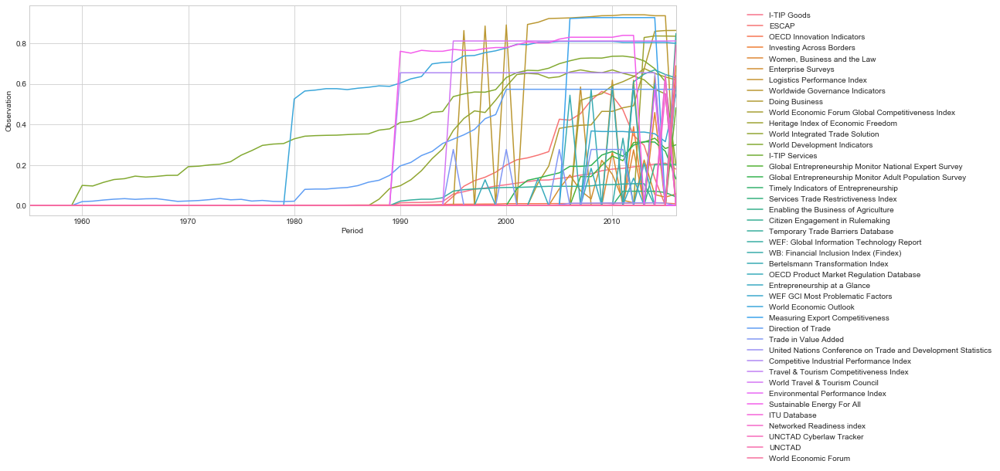

In [43]:
plt.figure(figsize=(15,5))
sns.tsplot(data=by_dataset_melt, time='Period', value='Observation', unit='title', condition = 'title')
plt.legend(loc='best', bbox_to_anchor=(1.1,1))

In [44]:
map_val = 'high_high'
dataset_coverage[dataset_coverage['mapping'] == map_val].index

Index(['Doing Business', 'I-TIP Services',
       'United Nations Conference on Trade and Development Statistics',
       'WEF: Global Information Technology Report',
       'Women, Business and the Law', 'World Development Indicators',
       'World Economic Forum Global Competitiveness Index',
       'World Integrated Trade Solution', 'World Travel & Tourism Council'],
      dtype='object', name='title')

In [45]:
list(set(dataset_coverage['mapping']))

['high_high', 'low_low', 'low_high', 'high_low']

C:\Users\mrpso\Anaconda3\lib\site-packages\seaborn\timeseries.py:183: UserWarning:

The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.



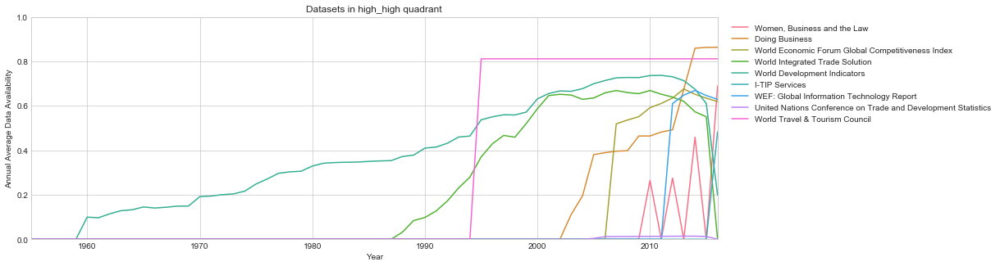

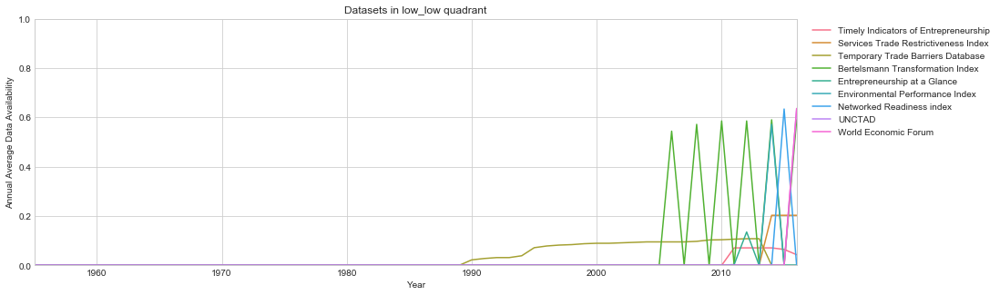

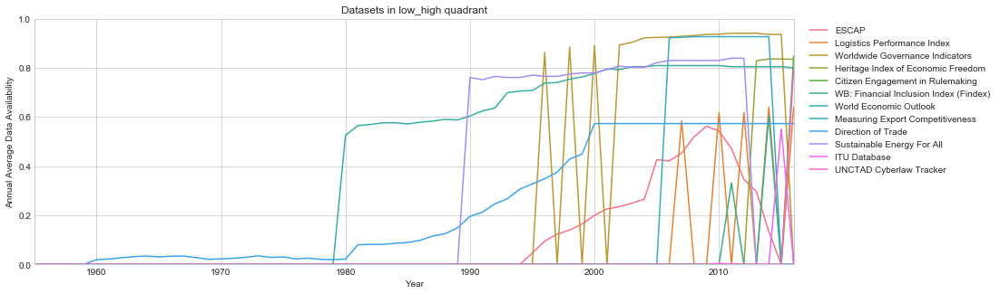

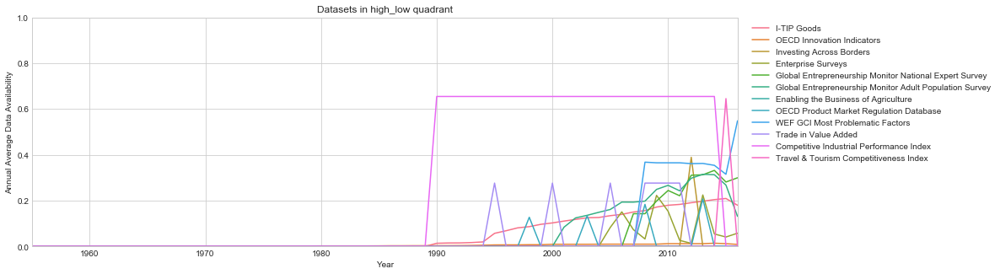

In [46]:
for map_val in list(set(dataset_coverage['mapping'])):
    plt.figure(figsize=(15,5))
    sns.tsplot(data=by_dataset_melt[by_dataset_melt['title'].isin(dataset_coverage[dataset_coverage['mapping'] == map_val].index)], time='Period', value='Observation', unit='title', condition = 'title')
    plt.legend(loc='best', bbox_to_anchor=(1.01,1))
    plt.title("Datasets in %s quadrant" % map_val)
    plt.xlabel("Year")
    plt.ylabel("Annual Average Data Availability")
    plt.ylim(0,1)
    plt.show()

In [47]:
df_provider = pd.read_csv("dataset_provider.csv").set_index('title')

In [48]:
dataset_coverage = dataset_coverage.join(df_provider, how='left')

In [49]:
dataset_coverage.groupby(['mapping', 'legal_text']).size().unstack(level=0)

mapping,high_high,high_low,low_high,low_low
legal_text,,,,
Bertelsmann Stiftung,NaN,NaN,NaN,1.0
Global Entrepreneurship Research Association,NaN,2.0,NaN,NaN
Heritage Index of Economic Freedom,NaN,NaN,1.0,NaN
IMF,NaN,NaN,2.0,NaN
International Telecommunications Union,NaN,NaN,1.0,NaN
OECD,NaN,3.0,NaN,3.0
UNCTAD,1.0,NaN,1.0,1.0
UNIDO,NaN,1.0,NaN,NaN
World Bank Group,4.0,3.0,7.0,1.0


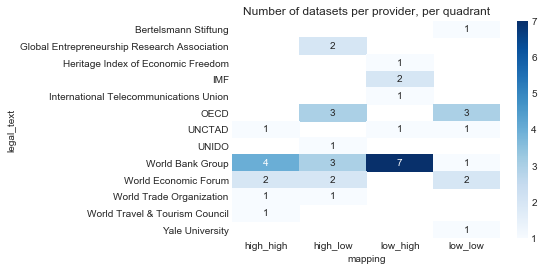

In [50]:
sns.heatmap(dataset_coverage.groupby(['mapping', 'legal_text']).size().unstack(level=0), annot=True, cmap='Blues')
plt.title("Number of datasets per provider, per quadrant")

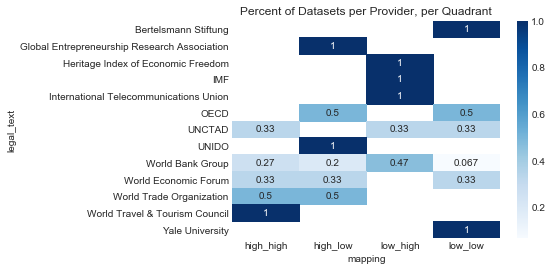

In [51]:
sns.heatmap((dataset_coverage.groupby(['mapping', 'legal_text']).size().unstack(level=0).T/dataset_coverage.groupby(['mapping', 'legal_text']).size().unstack(level=0).sum(axis=1)).T, annot=True, cmap='Blues')
plt.title("Percent of Datasets per Provider, per Quadrant")

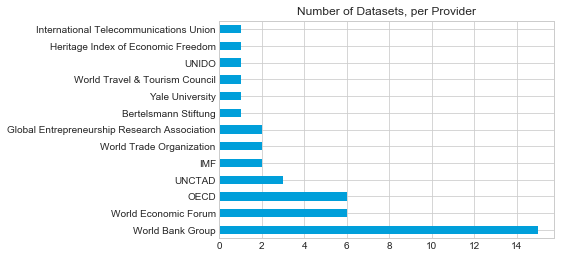

In [52]:
dataset_coverage['legal_text'].value_counts().plot(kind='barh')
plt.title("Number of Datasets, per Provider")

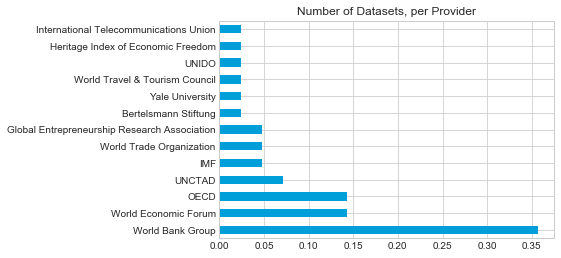

In [53]:
dataset_coverage['legal_text'].value_counts(normalize=True).plot(kind='barh')
plt.title("Number of Datasets, per Provider")